# Planning the 2017 sales campaign and Analyzing most profitable games

I am going to make an analysis report for the online store Ice, which sells video games all over the world. User and expert reviews, genres, platforms (e.g. Xbox or PlayStation), and historical data on game sales are available from open sources. I'm planning to identify patterns that determine whether a game will succeed or not. This will allow me to spot potential big winners and plan advertising campaigns.

<div style="border:solid green 2px; padding: 5px"> <h1 style="color:green; margin-bottom:20px"><u>Reader's notes:</u></h1>

<p style="font-size: 16px">In front of you is data going back to 2016.</p>
<p style="font-size: 16px">The dataset contains the abbreviation <b>ESRB = The Entertainment Software Rating Board</b> evaluates a game's content and assigns an age rating such as Teen or Mature.</p>
</div>


-----------------------------------------------------
-----------------------------------------------------

# 1. Initialization

I'll start by loading all necessary libraries:

In [1]:
# General libraries:
import pandas as pd
import numpy as np
import scipy.stats as st
import math as mt
import random as rd

# Data visualization libraries:
import matplotlib.pyplot as plt
import matplotlib.markers as mrk
import seaborn as sns
try: # importing plotly
    import plotly.express as px
    import plotly.graph_objects as go
except: # installing plotly using pip (in case environment lack the library)
    !pip install plotly-express
    import plotly.express as px
    import plotly.graph_objects as go


Creating an index slicing variable:

In [2]:
# Creating an Index Slice variable -
idx = pd.IndexSlice

-----------------------------------------------------

### 1.1 Load Data

Now the raw data will be loaded into a DataFrame varible:

In [3]:
# Loading the data file
try:
    games = pd.read_csv('C:/DataBases/games.csv') # load data on local path
    
except:
    games = pd.read_csv('/datasets/games.csv')

-----------------------------------------------------

### 1.2 Exploring the Initial Data

The raw `games` DataFrame contains the following columns:
- `Name`
- `Platform`
- `Year_of_Release`
- `Genre`
- `NA_sales` - North American sales in USD million
- `EU_sales` - Sales in Europe in USD million
- `JP_sales` - Sales in Japan in USD million
- `Other_sales` - Sales in other countries in USD million
- `Critic_Score` - Maximum of 100
- `User_Score` - Maximum of 10
- `Rating` - The ESRB rating

We'll start exploring the data.

Let's begin by getting a glimpse of the first rows:

In [4]:
# Checking the first 10 rows of the data -
games.head(10)

,Name,Platform,Year_of_Release,Genre,NA_sales,EU_sales,JP_sales,Other_sales,Critic_Score,User_Score,Rating
0,Wii Sports,Wii,2006.0,Sports,41.36,28.96,3.77,8.45,76.0,8,E
1,Super Mario Bros.,NES,1985.0,Platform,29.08,3.58,6.81,0.77,NaN,NaN,NaN
2,Mario Kart Wii,Wii,2008.0,Racing,15.68,12.76,3.79,3.29,82.0,8.3,E
3,Wii Sports Resort,Wii,2009.0,Sports,15.61,10.93,3.28,2.95,80.0,8,E
4,Pokemon Red/Pokemon Blue,GB,1996.0,Role-Playing,11.27,8.89,10.22,1.00,NaN,NaN,NaN
5,Tetris,GB,1989.0,Puzzle,23.20,2.26,4.22,0.58,NaN,NaN,NaN
6,New Super Mario Bros.,DS,2006.0,Platform,11.28,9.14,6.50,2.88,89.0,8.5,E
7,Wii Play,Wii,2006.0,Misc,13.96,9.18,2.93,2.84,58.0,6.6,E
8,New Super Mario Bros. Wii,Wii,2009.0,Platform,14.44,6.94,4.70,2.24,87.0,8.4,E
9,Duck Hunt,NES,1984.0,Shooter,26.93,0.63,0.28,0.47,NaN,NaN,NaN


And another look of the last rows:

In [5]:
# Checcking the last 10 rows of the data -
games.tail(10)

,Name,Platform,Year_of_Release,Genre,NA_sales,EU_sales,JP_sales,Other_sales,Critic_Score,User_Score,Rating
16705,15 Days,PC,2009.0,Adventure,0.00,0.01,0.00,0.0,63.0,5.8,NaN
16706,Men in Black II: Alien Escape,GC,2003.0,Shooter,0.01,0.00,0.00,0.0,NaN,tbd,T
16707,Aiyoku no Eustia,PSV,2014.0,Misc,0.00,0.00,0.01,0.0,NaN,NaN,NaN
16708,Woody Woodpecker in Crazy Castle 5,GBA,2002.0,Platform,0.01,0.00,0.00,0.0,NaN,NaN,NaN
16709,SCORE International Baja 1000: The Official Game,PS2,2008.0,Racing,0.00,0.00,0.00,0.0,NaN,NaN,NaN
16710,Samurai Warriors: Sanada Maru,PS3,2016.0,Action,0.00,0.00,0.01,0.0,NaN,NaN,NaN
16711,LMA Manager 2007,X360,2006.0,Sports,0.00,0.01,0.00,0.0,NaN,NaN,NaN
16712,Haitaka no Psychedelica,PSV,2016.0,Adventure,0.00,0.00,0.01,0.0,NaN,NaN,NaN
16713,Spirits & Spells,GBA,2003.0,Platform,0.01,0.00,0.00,0.0,NaN,NaN,NaN
16714,Winning Post 8 2016,PSV,2016.0,Simulation,0.00,0.00,0.01,0.0,NaN,NaN,NaN


We can already notice a few issues that will require attention:
- The **missing values** in all of the ratings column (i.e. `'Critic_Score'`, `'User_Score'`, `'Rating'`).
- All columns' **names will need to be lowercased**, as the values in the `'Name'`, `'Platform'` and `'Genre'` columns. This will be needed to be done in order to prevent duplicated values, mispronounciation of columns and values, etc.
- The `'Year_of_Release'` column can be converted to `int64` dtype.
- The `'Platform'`, `'Genre'` and `'Rating'` columns could be converted to categorial dtype (i.e. the `category'` dtype).
- The 'tbd' value in the 16706 row (i.e. the 2nd row in the 'last-rows-of-the-data' DF) is hinting the column's data is not of a numerical dtype, and we will need to check if all missing values and 'tbd' values have a connection.
- There are some rows with absolutely zero sales and I bet the majority of them won't have a rating. As we know most of the data is incomplete, we can probably assume these rows represent freshly new or soon-to-be-released games. This will be explored later on.

On to checking the data's general information overview:

In [6]:
# Using info() to check the data's general overview -
games.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 16715 entries, 0 to 16714
Data columns (total 11 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   Name             16713 non-null  object 
 1   Platform         16715 non-null  object 
 2   Year_of_Release  16446 non-null  float64
 3   Genre            16713 non-null  object 
 4   NA_sales         16715 non-null  float64
 5   EU_sales         16715 non-null  float64
 6   JP_sales         16715 non-null  float64
 7   Other_sales      16715 non-null  float64
 8   Critic_Score     8137 non-null   float64
 9   User_Score       10014 non-null  object 
 10  Rating           9949 non-null   object 
dtypes: float64(6), object(5)
memory usage: 1.4+ MB


The issues rising from the output, adding to the ones we found before, are as follows:
- There are **missing values** in the `'Name'`, `'Year_of_Release'`, `'Genre'`, `'Critic_Score'`, `'User_Score'` and `'Rating'` columns. The fact the `'Name'` and `'Genre'` both have the same amount of these, just 2 missing values, is worth an exploration.
- **Wrong dtypes**: as we already said above, `'Year_of_Release'` needs to be changed to int64 dtype and `'User_Score'` needs to be changed to a numerical float64 dtype.
- The categorical columns stated above will need to be converted to the `category` dtype.

Now, let's describe the data:

In [7]:
# Describing the data -
games.describe()

,Year_of_Release,NA_sales,EU_sales,JP_sales,Other_sales,Critic_Score
count,16446.000000,16715.000000,16715.000000,16715.000000,16715.000000,8137.000000
mean,2006.484616,0.263377,0.145060,0.077617,0.047342,68.967679
std,5.877050,0.813604,0.503339,0.308853,0.186731,13.938165
min,1980.000000,0.000000,0.000000,0.000000,0.000000,13.000000
25%,2003.000000,0.000000,0.000000,0.000000,0.000000,60.000000
50%,2007.000000,0.080000,0.020000,0.000000,0.010000,71.000000
75%,2010.000000,0.240000,0.110000,0.040000,0.030000,79.000000
max,2016.000000,41.360000,28.960000,10.220000,10.570000,98.000000


There are some interesting stuff we should explore looking at the output from the describe() method:
- More than 25% of the games don't have sales in **any** area. Also, the top 75 percentiles didn't even pass the 0.24 million dollars mark.
- The fact that about half the games in the DF, 8K out of 16K, doesn't have a critic score should be explored.
- The first 25 percentiles of the data has games ranged from the start of the eighties to the start of the new milenia (1980 to 2003), presenting a much wider qurtile range than the other quartiles, meeaning there are much fewer games from the period before 2003, and there might be less games to explore from these years.
- Just the first 25 percentiles of the games in the data received less than 60 `'Critic_Score'` points, we should explore these to understand what lowers a game critic score.

Now I'll calculate the percentages of missing values in each column of the DF:

In [8]:
# Calculating the share of missing values in the `games` DF -
print('\033[1m\x1b[4mPercentage of missing values in the `games` DF\x1b[0m:\n\n',\
      round(games.isna().sum() / len(games.isna()) * 100, ndigits=3), sep='')

Percentage of missing values in the `games` DF:

Name                0.012
Platform            0.000
Year_of_Release     1.609
Genre               0.012
NA_sales            0.000
EU_sales            0.000
JP_sales            0.000
Other_sales         0.000
Critic_Score       51.319
User_Score         40.090
Rating             40.479
dtype: float64


Supporting my previous assumptions, seems like:
- Between 40 to 51 percents of the games don't have rating from critics, users, or the ESRB.
- There is something fishy in the `'Name'` and `'Genre'` columns that's related. Nevertheless, these rows still present an insignificant share of the data, but we'll check them just to see why they're there.

Let's check for duplicates in the DF:

In [9]:
# Checking for complete dupicated rows -
print('\033[1m\x1b[1mCompletely duplicated rows in the DF:\x1b[0m', games.duplicated().sum())

# Checking for duplicated names -
print('\033[1m\x1b[1mDuplicated `Name` values in the DF:\x1b[0m', games['Name'].duplicated().sum())

Completely duplicated rows in the DF: 0
Duplicated `Name` values in the DF: 5155


Seems like there are 5.1k duplicated names in the data, but as we already know, each game's data is splitted between different platforms it was released on. To be certain we will explore duplicated row titles in the next section.

### 1.3 Conclusions and further steps

After the initial data estimation of the data, we noticed a few issues -
- Columns' names and a few `str` dtype columns' values are capitalized.
- Missing values in the `'Name'`, `'Year_of_Release'`, `'Genre'`, `'Critic_Score'`, `'User_Score'` and `'Rating'` columns. There are around 40.4 to 51.3 percents of the games with a missing value in all rating and scores columns including the ESRB `Rating`.
- Wrong dtypes: The `'Year_of_Release'` column can be converted to `int64` dtype. The `'Platform'`, `'Genre'` and `'Rating'` columns could be converted to categorial dtype (i.e. the `category` dtype).
- At least 25% of the rows have absolutely zero sales.
- The first 25 percentiles of the data has games ranged from the start of the eighties to the start of the new milenia (1980 to 2003), presenting a much wider qurtile range than the other quartiles, meaning there are much fewer games from the period before 2003, and there might be less games to explore from these years.
- There are 5.1k duplicated `name` rows in the DF.

My assumptions are:
- There is a connection between the missing values in the `Name'` and `'Genre'` columns, as they both contain the same amount of missing values.
- The missing values in all the rating and scores columns might be missing due to the games not being rated yet, or due to the games not being published at all with a TBD date.
- As we know - most of the data is incomplete. So we can probably assume the rows with zero sales represent freshly new or soon-to-be-released games.
- A few of the rows that contain missing values already have all values, but in another complete row of the same title.

Therefore, besides obviously dealing with missing values and data types conversions, the following steps will be:
- All columns' **names will need to be lowercased**, as the values in the `'Name'`, `'Platform'` and `'Genre'` columns. This will be needed to be done in order to prevent duplicated values, mispronounciation of columns and values, etc.
- Check for a connection between the `'tbd'` values to NaN values in the rating columns. It might be the missing values represent rows of games which haven't been rated  or even published to be able to be rated at all.
- Check if missing values in the ratings columns are hinting of unreleased and unrated games.
- We will check the rows that contained zero sales in all regions and try to find a connection to missing ratings to determine whether these rows' values are missing because they are unreleased or newly released.
- We'll enrich data with a few parameters including total sales and sales per year the game was published.


-----------------------------------------------------
-----------------------------------------------------

# 2. Data Preprocessing

We will use this section to fix and prepare the data to analysis.

-----------

## 2.1 Fixing columns' names

I'll begin by lowercasing the columns' names below:

In [10]:
# Lowercasing the columns' names -
games.columns = games.columns.str.lower()

# Checking new columns' names -
# Printing the DF's new columns' names -
print('\033[1m\x1b[4mThe `games` DF new columns names\x1b[0m:\n', sep='\n')
for col in games.columns:
    print(col, end=' | ')

The `games` DF new columns names:

name | platform | year_of_release | genre | na_sales | eu_sales | jp_sales | other_sales | critic_score | user_score | rating | 

#### *Result:*

Columns' names have been lowercased.

----------------------

## 2.2 Treat missing values

There are missing values in the columns `'name'`, `'year_of_release'`, `'genre'`, `'critic_score'`, `'user_score'` and `'rating'`.

$Remainder:$ Most of the columns with missing values has an insignificant amount of missing values. Hence, we will check them purely for understanding why they are missing.

We shall go over each column individually and fix it:

### 2.2.1 **`'name'` - The game's title & `'genre'` of the game:**

Since both columns seem to have the exact and suspiciously same tiny amount of missing values, let's check the rows of the `'name'` column and see if they're overlaping with the missing values from the `'genre'` column to decide how to deal with them.

In [11]:
# Filter rows where 'name' is missing into a variable -
missing_name = games[games['name'].isna()]

# Display rows -
display(missing_name)

,name,platform,year_of_release,genre,na_sales,eu_sales,jp_sales,other_sales,critic_score,user_score,rating
659,NaN,GEN,1993.0,NaN,1.78,0.53,0.00,0.08,NaN,NaN,NaN
14244,NaN,GEN,1993.0,NaN,0.00,0.00,0.03,0.00,NaN,NaN,NaN


Seems like we were right and both games hve missing values in both columns. They also appear to have some sales, so they might be of actual games, but since there is no way to know hich games are they and they are just 2 rows or macro-speaking 0.1% of the data, we can just drop tem because of their insignificance:

In [12]:
# Sanity Check- Before operation:
print("Before the operation amount of rows in the `games` DF :", len(games))

# Filtering the data to drop the rows with missing values in the 'name' and 'genre' columns -
games = games[~games['name'].isna()]

# Sanity Check- Before operation:
print("Before the operation amount of rows in the `games` DF :", len(games))
print(f'Rows dropped - {len(missing_name)} rows.')

Before the operation amount of rows in the `games` DF : 16715
Before the operation amount of rows in the `games` DF : 16713
Rows dropped - 2 rows.


#### *Result:*

We dropped the 2 rows containing missing values in the `'name'` and `'genre'` columns from the DF.

### 2.2.2 **`year_of_release`:**

$Note:$ The missing values in the column represent an insignificant amount of rows from the data, we will check them in that section *only for curiosity fulfillment* .

Let's start by checking the rows where the release year was missing:

In [13]:
# Creating a filtered DF with all rows containing missing release year value -
filt_df = games[games['year_of_release'].isna()]

# Checking why the `year_of_release` values are missing by looking at the filtered DF -
display(filt_df)

,name,platform,year_of_release,genre,na_sales,eu_sales,jp_sales,other_sales,critic_score,user_score,rating
183,Madden NFL 2004,PS2,NaN,Sports,4.26,0.26,0.01,0.71,94.0,8.5,E
377,FIFA Soccer 2004,PS2,NaN,Sports,0.59,2.36,0.04,0.51,84.0,6.4,E
456,LEGO Batman: The Videogame,Wii,NaN,Action,1.80,0.97,0.00,0.29,74.0,7.9,E10+
475,wwe Smackdown vs. Raw 2006,PS2,NaN,Fighting,1.57,1.02,0.00,0.41,NaN,NaN,NaN
609,Space Invaders,2600,NaN,Shooter,2.36,0.14,0.00,0.03,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...
16373,PDC World Championship Darts 2008,PSP,NaN,Sports,0.01,0.00,0.00,0.00,43.0,tbd,E10+
16405,Freaky Flyers,GC,NaN,Racing,0.01,0.00,0.00,0.00,69.0,6.5,T
16448,Inversion,PC,NaN,Shooter,0.01,0.00,0.00,0.00,59.0,6.7,M
16458,Hakuouki: Shinsengumi Kitan,PS3,NaN,Adventure,0.01,0.00,0.00,0.00,NaN,NaN,NaN


We can observe that a few games which contains missing values in the release year column contain the year in the game's title (i.e. the `name` column), which is something pretty casual mostly in sports games.

After understanding this we will need to check if we can fill the year of games containing their release year in the `name` column with their stated release year. We will filter the DF to check how many games of the such we have and then fill their release years:

In [14]:
# Creating the 'extracted_year' column which include all of the games with release year in their title -
filt_df['extracted_year'] = games['name'].astype('str').str.extractall('(\d+)').unstack().fillna('').sum(axis=1).astype('I');

# Amount of missing values left in the column, if any -
print('The total amount of missing values in the column:',\
     filt_df['year_of_release'].isna().sum());

# Since all years are missing in that filtered DF,
# we can just overwrite the column with the `extracted_year` column -
filt_df['year_of_release'] = filt_df['extracted_year']

# Amount of missing values left in the column, if any -
print('The amount of missing values left in the column (after filling column with `extracted_year`):',\
     filt_df['year_of_release'].isna().sum());

# Dropping games where extracted numerical values weren't the release year -
filt_df = filt_df[filt_df['year_of_release'] >= 1960]

# Amount of missing values left in the column, if any -
print('The amount of missing values left in the column (after dropping non-year numerical values):',\
     filt_df['year_of_release'].isna().sum());

# Printing fixed rows -
print("\nThe amount of rows where the game's title contained their release year:", len(filt_df));
display(filt_df);

The total amount of missing values in the column: 269
The amount of missing values left in the column (after filling column with `extracted_year`): 203
The amount of missing values left in the column (after dropping non-year numerical values): 0

The amount of rows where the game's title contained their release year: 18


C:\Users\lior-\AppData\Local\Temp\ipykernel_14016\4005922997.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  filt_df['extracted_year'] = games['name'].astype('str').str.extractall('(\d+)').unstack().fillna('').sum(axis=1).astype('I');
C:\Users\lior-\AppData\Local\Temp\ipykernel_14016\4005922997.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  filt_df['year_of_release'] = filt_df['extracted_year']


,name,platform,year_of_release,genre,na_sales,eu_sales,jp_sales,other_sales,critic_score,user_score,rating,extracted_year
183,Madden NFL 2004,PS2,2004.0,Sports,4.26,0.26,0.01,0.71,94.0,8.5,E,2004.0
377,FIFA Soccer 2004,PS2,2004.0,Sports,0.59,2.36,0.04,0.51,84.0,6.4,E,2004.0
475,wwe Smackdown vs. Raw 2006,PS2,2006.0,Fighting,1.57,1.02,0.00,0.41,NaN,NaN,NaN,2006.0
1650,NASCAR Thunder 2003,PS2,2003.0,Racing,0.60,0.46,0.00,0.16,84.0,8.7,E,2003.0
2492,MLB SlugFest 20-03,PS2,2003.0,Sports,0.41,0.32,0.00,0.11,77.0,8.2,E,2003.0
2572,PES 2009: Pro Evolution Soccer,PSP,2009.0,Sports,0.04,0.33,0.26,0.17,NaN,NaN,NaN,2009.0
3486,Madden NFL 2002,XB,2002.0,Sports,0.53,0.02,0.00,0.03,90.0,8.1,E,2002.0
4775,NFL GameDay 2003,PS2,2003.0,Sports,0.20,0.15,0.00,0.05,60.0,tbd,E,2003.0
5156,NBA Live 2003,XB,2003.0,Sports,0.31,0.04,0.00,0.01,82.0,8.8,E,2003.0
5336,Tomb Raider (2013),PC,2013.0,Action,0.06,0.25,0.00,0.04,86.0,8.5,M,2013.0


#### *Interim conclusion:*

As you can clearly see, we extracted the year for just 66 rows out of the original 269 missing value rows, and out of these ones 18 rows were actual games with a year in their game title (`'name'`).

I repeat that we checked these rows purely for curiosity, so since all these rows represent a total share of 1.6% of the data and we can fix only 0.1% of the data (66 rows) we will just drop all of them out of insignificance:

In [15]:
# Sanity Check- Before operation:
print("\033[1m\x1b[1mBefore the operation amount of missing values in column:\x1b[0m", games['year_of_release'].isna().sum())

# Dropping all missing values in the `year_of_release` column -
games = games[~games['year_of_release'].isna()]

# Sanity Check- After operation:
print("\033[1m\x1b[1mAfter the operation amount of missing values in column:\x1b[0m", games['year_of_release'].isna().sum())

Before the operation amount of missing values in column: 269
After the operation amount of missing values in column: 0


#### *Result:*

We dropped the 269 rows which contained missing values in the `'year_of_release'` column, which stands for 1.6% of the whole data.

### 2.2.3 **$Checking$ $a$ $connection$ $between$ $the$ $rating$ $and$ $scores$ $columns$ - `'critic_score'`, `'user_score'` and `'rating'`**

As I stated before, the missing values percentages table we made during the initial exploration of the data showed that all three rating columns have between 40.1 to 51.4 percents of missing values in the columns. I will test the theory there's a large share of common rows with missing values in all 3 columns and after we decide how to deal with them we will handle the remainders of the missing values in each individual column.

In [16]:
# Creating a filtered DF containing all rows where all 3 rating columns are missing -
overlap_missing_ratings = games[(games['critic_score'].isna())\
                                & (games['user_score'].isna())\
                                & (games['rating'].isna())]

# Checking amount of rows in the data -
print(f'The share of the rows where all rating columns contain missing values: \
{len(overlap_missing_ratings) / len(games):.2%}')

# Amount of possible unreleased games -
possible_unreleased = overlap_missing_ratings\
.query("na_sales == 0 & eu_sales == 0 & jp_sales == 0 & other_sales == 0 & year_of_release == 2016")
print(f'Amount of unreleased games (no sales or ratings and released in 2016): \
{len(possible_unreleased)} matching rows.')

# Taking a glance of the data -
display(overlap_missing_ratings)

The share of the rows where all rating columns contain missing values: 39.73%
Amount of unreleased games (no sales or ratings and released in 2016): 0 matching rows.


,name,platform,year_of_release,genre,na_sales,eu_sales,jp_sales,other_sales,critic_score,user_score,rating
1,Super Mario Bros.,NES,1985.0,Platform,29.08,3.58,6.81,0.77,NaN,NaN,NaN
4,Pokemon Red/Pokemon Blue,GB,1996.0,Role-Playing,11.27,8.89,10.22,1.00,NaN,NaN,NaN
5,Tetris,GB,1989.0,Puzzle,23.20,2.26,4.22,0.58,NaN,NaN,NaN
9,Duck Hunt,NES,1984.0,Shooter,26.93,0.63,0.28,0.47,NaN,NaN,NaN
10,Nintendogs,DS,2005.0,Simulation,9.05,10.95,1.93,2.74,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...
16710,Samurai Warriors: Sanada Maru,PS3,2016.0,Action,0.00,0.00,0.01,0.00,NaN,NaN,NaN
16711,LMA Manager 2007,X360,2006.0,Sports,0.00,0.01,0.00,0.00,NaN,NaN,NaN
16712,Haitaka no Psychedelica,PSV,2016.0,Adventure,0.00,0.00,0.01,0.00,NaN,NaN,NaN
16713,Spirits & Spells,GBA,2003.0,Platform,0.01,0.00,0.00,0.00,NaN,NaN,NaN


Although we were right and there's an overlap of 39.73% of the rows containing missing values in these columns, **they're not unreleased games**, because for them to be so they have to have zero sales and be published in 2016 (which is the newest year the database contained).

Hence, it looks like the theory of a connection between the missing values is existent is actually partly right, but the connection between them cannot be explained by the data, except that maybe the connection is just circumstantial and Ice didn't payed for an ESRB `rating` for these games, or that they didn't got a `critic_score` from critics or didn't got rated by users (`user_score`). Maybe even because the games lack of success caused the missing reviews and need for paying over an ESRB rating for them.

#### *Conclusion:*

The theory the overlaping missing values are connected has been partly proven, yet the connection between them is probably circumstantial, and is now **proven not to be connected to newly released or unreleased games**. Therefore we are forced to fill missing values *individually* in each of the remaining columns.

### 2.2.4 **`rating` - The ESRB age rating:**

The smartest act to play will be to use each `genre` most common ESRB `rating` (i.e. the mode value).

To do so, we will check each of the genres mode rating values, and create a function that will fill each missing game `rating` value with the game's genre's most common rating:

In [17]:
# A) Creating a counter dictionary -
genre_mode_rating = {}

# Finding each `genre` mode `rating` value and storing it in the dictionary -
for g in games['genre'].unique():
    genre_mode_rating[g] = games[games['genre']==g]['rating'].mode()[0]

# -------------------------------------------------------------------------------------------------------------------------
# B) Creating the mode_rating() function,
# which will fill missing rating value with the mode value for each genre in each row -
def mode_rating(row):
    if pd.isna(row["rating"]):
        row['rating'] = genre_mode_rating[row['genre']]
    return row

# -------------------------------------------------------------------------------------------------------------------------
# c) Filling the column:
# Sanity-check BEFORE fillment of missing values:
print(f"Sanity check-\nNumber of missing values \033[1m\x1b[4mbefore\x1b[0m filling them: {games['rating'].isna().sum()}",\
      end='\n\n')

# Filling the `rating` column's missing values with the mode_rating() function -
games = games.apply(mode_rating, axis=1)
    
# Sanity-check AFTER fillment of missing values:
print(f"Sanity check-\nNumber of missing values \033[1m\x1b[4mafter\x1b[0m filling them: {games['rating'].isna().sum()}")

Sanity check-
Number of missing values before filling them: 6676

Sanity check-
Number of missing values after filling them: 0


#### *Result:*

We used the created mode rating per genre dictionary (i.e. `genre_mode_rating`) and the defined `mode_rating()` function to fill the 6676 missing values in the data's ESRB `rating` column.

### 2.2.5 **`critic_score` - The critics' reviews score:**

The amount of missing values in the column, 51% of the data, is just too large, and we don't know if the reason these values are missing is because they had no reviews from critics or they were just missed while entering the data.

**We will leave the values as they are**, as `NaN`'s. To prevent miscalculations we will need to leave the column's dtype the `float64` dtype, which is a pandas decimals dtype that supports `NaN`'s in arithmetic and statistical operations.

#### *Result:*

We left the `critic_score` column's missing values as they were, because changing them according to whatever parameter we will choose will defect the data's honesty, as while affecting more than 51 percents of the column, it will defect any later finding we will get.

### 2.2.6 **`user_score` - The users' reviews score:**

We know the column contains 'tbd' values (i.e. "To be due"), which are making the column's values `object` dtype.

Since these games `user_score` is "to be due", it was probably not given to Ice analytics department yet, **therefore - it can be considered missing**.

We will check their amount, and we will change these values to `NaN` values, and convert the column to the numeric, pro-NaN dtype `float64`:

In [18]:
# Checking the amount of 'tbd' values in the column -
print("\033[1m\x1b[1mAmount of 'tbd' values in the column:\x1b[0m", len(games[games['user_score'] == "tbd"]),\
     "\n\033[1m\x1b[1mShare of the column:\x1b[0m", round(len(games[games['user_score'] == "tbd"]) / len(games) * 100, ndigits=2), '%\n',\
     end='--------------------------------------------------------------------------------------------------------\n')

# Sanity Check- Before operation:
print("\033[1m\x1b[4mBefore\x1b[0m the operation amount of NaN's in column:", games['user_score'].isna().sum())

# Changing all 'tbd' columns to `NaN` values -
games['user_score'] = games['user_score'].replace('tbd', np.nan).astype('float64')

# Sanity Check- After operation:
print("\033[1m\x1b[4mAfter\x1b[0m the operation amount of NaN's in column:", games['user_score'].isna().sum())

Amount of 'tbd' values in the column: 2376 
Share of the column: 14.45 %
--------------------------------------------------------------------------------------------------------
Before the operation amount of NaN's in column: 6605
After the operation amount of NaN's in column: 8981


#### *Result:*

We turned the 2376 rows which contained the value 'tbd' to `NaN` values, raising the column's missing values total from 6605 to 8981 missing values, **which we will leave in the column as they are**; That is because we have no other base to fill them that won't defect the column's data integrity, as while it contains 40.1% missing values, filling it with any uncertain values will damage and skew results in later analysis and calculations.

### 2.2.7 Final Missing Values Check

Let's check if everything is fine regrding missing values now, knowing that we have left all missing values in the `critic_score` and `user_score` columns:

In [19]:
# Missing values Check -
games.isna().sum()

name                  0
platform              0
year_of_release       0
genre                 0
na_sales              0
eu_sales              0
jp_sales              0
other_sales           0
critic_score       8461
user_score         8981
rating                0
dtype: int64

The data's missing values are handled, including the `critic_score` and the `user_score` columns' missing values that we left still because dropping or filling them would harm the data's integrity.

------------------------------

## 2.3 Handling duplicated rows

Since we know some games contain different rows of the same game in different platforms, we will need to check for duplicates of rows with the same game title and platform:

In [20]:
# Creating the `dup_check` DF to check for duplicates -
dup_check = games[['name', 'platform']]

# Printing amount of duplicates -
print(f"\033[1m\x1b[1mAmount of duplicated rows in the `dup_check`:\x1b[0m {len(dup_check[dup_check.duplicated()])} rows.")

# Checking for duplicates of the same games on the same platforms -
dup_check[dup_check.duplicated()]

Amount of duplicated rows in the `dup_check`: 3 rows.


,name,platform
1591,Need for Speed: Most Wanted,X360
11715,Need for Speed: Most Wanted,PC
16230,Madden NFL 13,PS3


Turns out we have 3 games which are duplicated in 2 or more rows.

Let's check them to individually to see how can we fix the problem, starting by checking all rows of `'Need for Speed: Most Wanted'` in the `games` DF:

In [21]:
# Checking the first game rows where platform was 'X360' or 'PC' -
games.query("name == 'Need for Speed: Most Wanted' & (platform == 'PC' | platform == 'X360')")

,name,platform,year_of_release,genre,na_sales,eu_sales,jp_sales,other_sales,critic_score,user_score,rating
1190,Need for Speed: Most Wanted,X360,2012.0,Racing,0.62,0.78,0.01,0.15,83.0,8.5,T
1591,Need for Speed: Most Wanted,X360,2005.0,Racing,1.00,0.13,0.02,0.10,83.0,8.5,T
5972,Need for Speed: Most Wanted,PC,2005.0,Racing,0.02,0.23,0.00,0.04,82.0,8.5,T
11715,Need for Speed: Most Wanted,PC,2012.0,Racing,0.00,0.06,0.00,0.02,82.0,8.5,T


It turns out, after a recheck on Google, that the game `'Need for Speed: Most Wanted'` was published both in 2005 and 2012, explaining why there are 2 separate rows of it in the data. There's no need to drop or fix any of the duplicates because they aren't ones.

Let's check the rows of `'Madden NFL 13'` in the `games` DF:

In [22]:
# Checking the second game rows where platform was 'PS3' -
games.query("name == 'Madden NFL 13' & platform == 'PS3'")

,name,platform,year_of_release,genre,na_sales,eu_sales,jp_sales,other_sales,critic_score,user_score,rating
604,Madden NFL 13,PS3,2012.0,Sports,2.11,0.22,0.0,0.23,83.0,5.5,E
16230,Madden NFL 13,PS3,2012.0,Sports,0.00,0.01,0.0,0.00,83.0,5.5,E


In contrary to the other case, it seems lie there are 2 rows in the data for the same game in the same platform and year, as the data somehow splitted. Normally I'd drop the duplicate row, but since it has 0.01 sales in Europe I'll add 0.01 to the 604 row's `eu_sales` and drop the 16230 row, just for the order:

In [23]:
# Adding the duplicate row's sales numbers -
games.loc[604,'eu_sales'] += games.loc[16230,'eu_sales']

# Sanity Check- Before operation:
print("\033[1m\x1b[4mBefore\x1b[0m the operation rows amount:", len(games))

# Dropping the duplicate row from the DF -
games.drop(16230, axis=0, inplace=True)

# Sanity Check- After operation:
print("\033[1m\x1b[4mAfter\x1b[0m the operation rows amount:", len(games))

Before the operation rows amount: 16444
After the operation rows amount: 16443


We've added the duplicated sales stats to the first stat which contained more data, and then dropped the duplicated row from the data.

#### *Conclusion regarding duplicated rows:*

After checking for duplicated rows where the same games in the same platforms get 2 or more separate rows, we found that only 1 out of 3 duplicates was actually a duplicate row and dropped it from the data after summing it's sales data to the original row.

The data doesn't contain duplicates.

-------------------------------

## 2.4 Fixing columns' data types

As I stated in the first section's conclusions, there's a need to fix the following columns dtype:
- The `'year_of_release'` column can be converted to `int64` dtype, as it represents full years.
- The `'platform'`, `'genre'` and `'rating'` columns could be converted to categorial dtype (i.e. the `category` dtype).

$Note:$ We have already converted the `'user_score'` column from the `object` dtype to the `float64` dtype in the last section.

Let's begin by converting the `year_of_release` values dtype from `float64` to `Int64`:

In [24]:
# Sanity Check- Before operation:
print("\033[1m\x1b[4mBefore\x1b[0m the operation 'year_of_release' column's dtype :", games['year_of_release'].dtype)

# Changing the 'year_of_release' dtype to Int64 -
games['year_of_release'] = games['year_of_release'].astype('int64')

# Sanity Check- After operation:
print("\033[1m\x1b[4mAfter\x1b[0m the operation 'year_of_release' column's dtype :", games['year_of_release'].dtype)

Before the operation 'year_of_release' column's dtype : float64
After the operation 'year_of_release' column's dtype : int64



Now, let's convert the categorical columns (`'platform'`, `'genre'` and `'rating'`) to the `category` dtype:

In [25]:
# Sanity Check- Before operation:
print(f"\033[1m\x1b[4mBefore\x1b[0m the operation:\n\
\t'platform' column's dtype - {games['platform'].dtype}\n\
\t'genre' column's dtype - {games['genre'].dtype}\n\
\t'rating' column's dtype - {games['rating'].dtype}")

# Changing the columns' dtypes to category -
games['platform'] = pd.Categorical(games.platform) # for 'platform'
games['genre'] = pd.Categorical(games.genre) # for 'genre'
games['rating'] = pd.Categorical(games.rating) # for 'rating'

# Sanity Check- After operation:
print(f"\n\033[1m\x1b[1mProcess being made...\x1b[0m\n\n\
\033[1m\x1b[4mAfter\x1b[0m the operation:\n\
\t'platform' column's dtype - {games['platform'].dtype}\n\
\t'genre' column's dtype - {games['genre'].dtype}\n\
\t'rating' column's dtype - {games['rating'].dtype}", end='\n\n')

# Checking the DF info() to see how dtypes changed -
display(games.info())

Before the operation:
	'platform' column's dtype - object
	'genre' column's dtype - object
	'rating' column's dtype - object

Process being made...

After the operation:
	'platform' column's dtype - category
	'genre' column's dtype - category
	'rating' column's dtype - category

<class 'pandas.core.frame.DataFrame'>
Int64Index: 16443 entries, 0 to 16714
Data columns (total 11 columns):
 #   Column           Non-Null Count  Dtype   
---  ------           --------------  -----   
 0   name             16443 non-null  object  
 1   platform         16443 non-null  category
 2   year_of_release  16443 non-null  int64   
 3   genre            16443 non-null  category
 4   na_sales         16443 non-null  float64 
 5   eu_sales         16443 non-null  float64 
 6   jp_sales         16443 non-null  float64 
 7   other_sales      16443 non-null  float64 
 8   critic_score     7982 non-null   float64 
 9   user_score       7462 non-null   float64 
 10  rating           16443 non-null  category


None

#### *Result:*

The data dtypes are now fixed:
- `year_of_release` has been converted to the `int64` dtype.
- The categorical columns (`'platform'`, `'genre'` and `'rating'`) have been converted to the `category` dtype.

## 2.5 Conclusions regarding Data Preprocessing

In this data preprocessing chapter:
1. We lowercased all columns names.
2. We handled the **missing values** columns:
    1. We dropped the 2 rows containing missing values in the `'name'` and `'genre'` columns from the DF.
    2. We dropped the 269 rows which contained missing values in the `'year_of_release'` column, which stands for 1.6% of the whole data.
        1. Before dropping the rows we tried to see if they're worth fixing, but it turned out we can fill only 66 rows, so we've decided the amount is too insignificant to affect later analysis.
    3. We filled the 6676 missing values in the data's ESRB `rating` column using the created mode-rating-per-genre dictionary (i.e. `genre_mode_rating`) and the defined `mode_rating()` function.
    
    4. **We left the `critic_score` column's missing values as they were**, because changing 51% of the data according to whatever parameter we will choose will defect the data's honesty, and it might defect any later finding we will get.
        1. Also, the column has been converted to the `float64` dtype so that it will be compatible to work with arithmetical and statistical operations.
    
    5. **We will leave the missing values in the column as they are**; While the column contains 40.1% missing values, filling it with any uncertain values will damage and skew results in later analysis and calculations.
        1. We turned the 2376 rows which originally contained the value `'tbd'` to `NaN` values, raising the column's missing values total from 6605 to 8981 missing values.
    
- $Note:$ Before filling the `'critic_score'`, `'user_score'` and `'rating'` columns, and in order to check the unreleased games theory from last chapter, we've found that there's an overlap of 39.73% of the rows containing missing values in these columns. After checking the data, **we have refuted our prior theory that games which overlap on these missing parameters are unreleased games**, because for them to be so they need to also have zero sales and be published in 2016 (which is the newest year the database contains); Hence we dealt with each column's missing values individually.

3. **Duplicates:** 
After checking for duplicated rows where the same games in the same platforms get 2 or more separate rows, we found that only 1 out of the 3 found duplicates was actually a duplicate row and dropped it from the data after summing it's sales data to the original row of the game on the specific platform.
4. **The data's dtypes** were fixed:
    1. `year_of_release` has been converted to the `int64` dtype.
    2. The categorical columns (`'platform'`, `'genre'` and `'rating'`) have been converted to the `category` dtype.
    3. The `'user_score'` column from the `object` dtype to the `float64` dtype during when we handled it's missing values.

-----------------------------------------------------
-----------------------------------------------------

# 3. Enriching the data

In this section we will enrich the data with parameter that will help our later analysis, such as:
- `total_sales` - The total sales number in all areas (for each game, per platform).
- `years_since_release` - Represents the amount of years since the game's release (Since 2016).
- `mean_yearly_sales` - Average yearly sales in all areas since a game's release (for each game, per platform).

## 3.1 Creating the Columns

### **3.1.1 Creating the `total_sales` column:**

To create the `total_sales` column, we can just sum the sales from each of the 4 areas of each game and we will get the total sales amount (in millions):

In [26]:
# Creating the `total_sales` column
# which is basicaly the sum of all sales for each game from all areas -
games['total_sales'] = games['na_sales'] + games['eu_sales'] + games['jp_sales'] + games['other_sales']

# Describing the new column -
print("\033[1m\x1b[4mDescribing the new `total_sales' column\x1b[0m:"), display(games['total_sales'].describe());

Describing the new `total_sales' column:


count    16443.000000
mean         0.536056
std          1.558829
min          0.000000
25%          0.060000
50%          0.170000
75%          0.470000
max         82.540000
Name: total_sales, dtype: float64

#### *Result:*

The `total_sales` column was created.

### **3.1.2 Creating the `years_since_release` column:**

To create the column, we will just substract the `year_of_release` from 2017, which is a year above the current year at the time of the data gathering. 

*The reason we are substracting from 2017 is because we were already been told that the 2016 data might not be complete yet, so since we don't know in which month of the year the data was collected, we can't project the 2016 games sales, therefore we will refer to 2016 released games as if they are on the market for one year.*

Let's create the column:

In [27]:
# Creating the `years_since_release` column,
# which represents the amount of years since a game's been released -
games['years_since_release'] = 2017 - games['year_of_release']

# Describing the new column -
print("\033[1m\x1b[4mDescribing the new `years_since_release' column\x1b[0m:"), display(games['years_since_release'].describe());

Describing the new `years_since_release' column:


count    16443.000000
mean        10.514079
std          5.875546
min          1.000000
25%          7.000000
50%         10.000000
75%         14.000000
max         37.000000
Name: years_since_release, dtype: float64

#### *Result:*

The `years_since_release` column was created. **Rows that contain the value `1` represent games from the claimed unfinished 2016 year**.

### **3.1.3 Creating the `mean_yearly_sales` column:**

To create the average yearly sales column, we will divide the `total_sales` by the amount of `years_on_market`, representing the average sales per year since each game was released:

In [28]:
# Creating the `mean_yearly_sales` parameter,
# which states the average sales per year for the amount of years since each game's been released -
games['mean_yearly_sales'] = round(games['total_sales'] / games['years_since_release'], ndigits=5)

# Describing the new column -
print("\033[1m\x1b[4mDescribing the new `mean_yearly_sales' column\x1b[0m:"), display(games['mean_yearly_sales'].describe());

Describing the new `mean_yearly_sales' column:


count    16443.000000
mean         0.072893
std          0.249868
min          0.000000
25%          0.006670
50%          0.018750
75%          0.053330
max          7.600000
Name: mean_yearly_sales, dtype: float64

#### *Result:*

The `mean_yearly_sales` column was created.

## 3.2 Checking Complete Data

Given the data is ready for the analysis, let's take just another quick look at the refurbished DataFrame. It is helpful to see what exactly are we going to use in the analysis:

In [29]:
# Checking the general information about the DataFrame -
print('\033[1m\x1b[4mGeneral information about the data\x1b[0m:\n');
display(games.info());

# Describing the DF columns -
print('\033[1m\x1b[4mDescription of the data\x1b[0m:'),;
display(games.describe());

# print a sample of data to get a general glimpse of how each row looks -
print('\n\033[1m\x1b[4mA random sample of the data\x1b[0m:');
display(games.sample(5));

General information about the data:

<class 'pandas.core.frame.DataFrame'>
Int64Index: 16443 entries, 0 to 16714
Data columns (total 14 columns):
 #   Column               Non-Null Count  Dtype   
---  ------               --------------  -----   
 0   name                 16443 non-null  object  
 1   platform             16443 non-null  category
 2   year_of_release      16443 non-null  int64   
 3   genre                16443 non-null  category
 4   na_sales             16443 non-null  float64 
 5   eu_sales             16443 non-null  float64 
 6   jp_sales             16443 non-null  float64 
 7   other_sales          16443 non-null  float64 
 8   critic_score         7982 non-null   float64 
 9   user_score           7462 non-null   float64 
 10  rating               16443 non-null  category
 11  total_sales          16443 non-null  float64 
 12  years_since_release  16443 non-null  int64   
 13  mean_yearly_sales    16443 non-null  float64 
dtypes: category(3), float64(8), int64

None

Description of the data:


,year_of_release,na_sales,eu_sales,jp_sales,other_sales,critic_score,user_score,total_sales,years_since_release,mean_yearly_sales
count,16443.000000,16443.000000,16443.000000,16443.000000,16443.000000,7982.000000,7462.000000,16443.000000,16443.000000,16443.000000
mean,2006.485921,0.264028,0.145939,0.078492,0.047597,68.992608,7.126548,0.536056,10.514079,0.072893
std,5.875546,0.818400,0.506731,0.311109,0.188011,13.920049,1.499429,1.558829,5.875546,0.249868
min,1980.000000,0.000000,0.000000,0.000000,0.000000,13.000000,0.000000,0.000000,1.000000,0.000000
25%,2003.000000,0.000000,0.000000,0.000000,0.000000,60.000000,6.400000,0.060000,7.000000,0.006670
50%,2007.000000,0.080000,0.020000,0.000000,0.010000,71.000000,7.500000,0.170000,10.000000,0.018750
75%,2010.000000,0.240000,0.110000,0.040000,0.030000,79.000000,8.200000,0.470000,14.000000,0.053330
max,2016.000000,41.360000,28.960000,10.220000,10.570000,98.000000,9.700000,82.540000,37.000000,7.600000



A random sample of the data:


,name,platform,year_of_release,genre,na_sales,eu_sales,jp_sales,other_sales,critic_score,user_score,rating,total_sales,years_since_release,mean_yearly_sales
4461,Eternal Sonata,PS3,2008,Role-Playing,0.19,0.12,0.07,0.05,80.0,7.8,T,0.43,9,0.04778
1894,Imagine: Babysitters,DS,2008,Simulation,0.63,0.35,0.00,0.10,NaN,NaN,E,1.08,9,0.12000
11363,Hello Kitty: Roller Rescue,GC,2005,Action,0.06,0.02,0.00,0.00,64.0,6.8,E,0.08,12,0.00667
2490,Mega Man Legends,PS,1997,Adventure,0.39,0.26,0.12,0.05,NaN,NaN,E,0.82,20,0.04100
8800,Kingdom of Paradise,PSP,2005,Role-Playing,0.14,0.00,0.00,0.01,72.0,7.5,T,0.15,12,0.01250


$Be$ $noted$ again we left the missing values in the `user_score` and `critic_score` columns to make sure we don't disrupt the end result of any analysis later, other than that - the data is all set. Now Let's begin our analysis.

------------------------
------------------------

# 4. Aggregating Data

We will use the following section to create aggregated and alternate DFs for further use.

To ease ordering the pivot tables MultiIndexed DFs, I'll define the `flat_DoubleIdx()` function which flatten DataFrames' 2-leveled MultiIndex to columns and normalize the data's index:

In [30]:
# Defining a function that gets rid of the double index:
def flat_DoubleIdx(df, idx1_col, idx2_col, reset_index=True, reorder=False, drop_one=False, drop_two=False):
    '''
    The flat_DoubleIdx() function is used to flatten 2-levels MultiIndex (or Double-Index), 
    and split the tupled indices to separate columns before dropping the original index.
    
    Parameters:
    df: The MultiIndexed DataFrame to flatten.
    idx1_col: The name of the index tuple first column. Also the 1st-level in the original DataFrame's MultiIndex.
    idx2_col: The name of the index tuple second column. Also the 2nd-level in the original DataFrame's MultiIndex.
    reset_index: True by default, resetting the original DataFrame's MultiIndex and dropping the old one.
    reorder: Placing the Index column/s at the beginning of the DataFrame. False by default. 
             Currently designed only to flatten a 2-leveled MultiIndex.
    drop_one: Recover only the second index from the tuple and dropping the first. False by default.
    drop_two: Recover only the first index from the tuple and dropping the second. False by default.
    '''
    
    # Flattening the `df` double (2-leveled) index -
    df.index = df.index.to_flat_index()

    # Salvaging the indices values from the tupled indices -
    idx_1 = [x[0] for x in df.index]
    idx_2 = [x[1] for x in df.index]

    # re-Creating the `idx_1` and `idx_2` columns -
    if drop_two == False:
        df[idx1_col] = idx_1
    if drop_one == False:
        df[idx2_col] = idx_2
        
    # Resetting index (As long as reset_index=True)-
    df.reset_index(drop=True,inplace=reset_index)
    
    # Placing the former index tuple's columns at the start of the DataFrame -
    if reorder==True:
        # Storing former-index column' name -
        if (drop_one == False) and (drop_two == False): # default procedure
            col_name_fir = df[idx1_col].name
            col_name_sec = df[idx2_col].name

        elif (drop_one == True) and (drop_two == True): # If user set both drop parameters to True
            print('\033[1m\x1b[31mError:\x1b[0m Cannot set both `drop_two` and `drop_one` to True.')
                     
        
        # Reordering the columns -
        if (drop_two == False) and (drop_one == False): # while both MultiIndex columns in DataFrame
            # Storing columns in interior variables -
            fir_col = df.pop(col_name_fir)
            sec_col = df.pop(col_name_sec)
            # Inserting the columns at the beginning of the DataFrame -
            df.insert(0,col_name_sec,sec_col)
            df.insert(0,col_name_fir,fir_col)
            
            
        elif (drop_two == True) or (drop_one == True): # If user set both drop parameters to True
            print('\033[1m\x1b[31mDevError:\x1b[0m \n\
            Function currently doesn\'t reorder while the drop_two or drop_one parameters are True.')

### **Creating the `unique_games` DF**

We'll create a DF that has aggregated sales data for each unique game, unlike the original DF platform-divided data:

In [31]:
# Aggregating the data to present each unique game's stats in all platform:
# -------------------------------------------------------------------------------------------------------------------------
# -------------------------------------------------------------------------------------------------------------------------
# A) Creating a pivot table that sums the stats from all platforms for each game,
# including games that were released under same title in different years:

# Creating an aggfunc parameter dictionary -
aggdict = {'na_sales':'sum', 
           'eu_sales':'sum', 
           'jp_sales':'sum', 
           'other_sales':'sum', 
           'total_sales':'sum',
           'mean_yearly_sales':'mean',
           }
# Creating the pivot table -
unique_games = games.pivot_table(index=['name', 'year_of_release'],\
                                 values=['na_sales', 'eu_sales', 'jp_sales', 'other_sales', \
                                         'mean_yearly_sales', 'total_sales'],\
                                aggfunc=aggdict)

# -------------------------------------------------------------------------------------------------------------------------
# B) Getting rid of the double index and 
# placing the new columns in the beginning of the DF -
flat_DoubleIdx(unique_games,'name','year_of_release',reorder=True)

# -------------------------------------------------------------------------------------------------------------------------
# c) Check the new DF -
display(unique_games)

,name,year_of_release,eu_sales,jp_sales,mean_yearly_sales,na_sales,other_sales,total_sales
0,Beyblade Burst,2016,0.00,0.03,0.03000,0.00,0.00,0.03
1,Fire Emblem Fates,2015,0.23,0.52,0.83500,0.81,0.11,1.67
2,Frozen: Olaf's Quest,2013,0.53,0.00,0.13750,0.48,0.09,1.10
3,Haikyu!! Cross Team Match!,2016,0.00,0.04,0.04000,0.00,0.00,0.04
4,Tales of Xillia 2,2012,0.12,0.45,0.16800,0.20,0.07,0.84
...,...,...,...,...,...,...,...,...
12190,thinkSMART FAMILY!,2010,0.00,0.00,0.00429,0.03,0.00,0.03
12191,thinkSMART: Chess for Kids,2011,0.00,0.00,0.00167,0.01,0.00,0.01
12192,uDraw Studio,2010,0.57,0.00,0.34571,1.65,0.20,2.42
12193,uDraw Studio: Instant Artist,2011,0.10,0.00,0.01583,0.07,0.02,0.19


#### *Result:*

The `unique_games` DF, which shows the total sales in all platforms for each unique game, was created.

### **Creating the `unique_plats` DF**

We'll create a DF that has aggregated sales data for each unique platform:

In [32]:
# Aggregating the data to present each unique game's stats in all platform:
# -------------------------------------------------------------------------------------------------------------------------
# -------------------------------------------------------------------------------------------------------------------------
# A) Creating a pivot table that sums the stats from all platforms for each game,
# including games that were released under same title in different years:

# Creating an aggfunc parameter dictionary -
aggdict = {'na_sales':'sum', 
           'eu_sales':'sum', 
           'jp_sales':'sum', 
           'other_sales':'sum', 
           'total_sales':'sum',
           'mean_yearly_sales':'mean',
           }
# Creating the pivot table -
unique_plats = games.pivot_table(index=['platform', 'year_of_release'],\
                                 values=['na_sales', 'eu_sales', 'jp_sales', 'other_sales', \
                                         'mean_yearly_sales', 'total_sales'],\
                                aggfunc=aggdict)

# -------------------------------------------------------------------------------------------------------------------------
# B) Getting rid of the double index and 
# placing the new columns in the beginning of the DF -
flat_DoubleIdx(unique_plats,'platform','year_of_release',reorder=True)

# Getting rid of rows where the platforms didn't make sales -
unique_plats['total_sales'].replace(0,np.nan, inplace=True)
unique_plats.dropna(inplace=True)

# -------------------------------------------------------------------------------------------------------------------------
# c) Check the new DF -
display(unique_plats)

,platform,year_of_release,eu_sales,jp_sales,mean_yearly_sales,na_sales,other_sales,total_sales
0,2600,1980,0.67,0.00,0.034174,10.59,0.12,11.38
1,2600,1981,1.96,0.00,0.021546,33.40,0.32,35.68
2,2600,1982,1.65,0.00,0.022921,26.92,0.31,28.88
3,2600,1983,0.34,0.00,0.015615,5.44,0.06,5.84
4,2600,1984,0.01,0.00,0.008180,0.26,0.00,0.27
...,...,...,...,...,...,...,...,...
1101,XB,2008,0.04,0.00,0.020000,0.13,0.01,0.18
1143,XOne,2013,5.34,0.02,0.249474,11.85,1.75,18.96
1144,XOne,2014,18.15,0.14,0.295464,30.97,4.81,54.07
1145,XOne,2015,18.47,0.17,0.375875,36.03,5.47,60.14


Now we will create the `peak_years()` function which will help us find each platform's peak sales year:

In [33]:
# Defining the peak_years() function,
# which find the best sales years for each platform -
def peak_years(df):
    peak_years = {}
    for uniq_p in df['platform'].unique():
        peak_sales = df.query('platform==@uniq_p').sort_values('total_sales', ascending=False).iloc[0,1]
        peak_years[uniq_p] = peak_sales
    return df['platform'].map(peak_years)

# Creating the `peak_year` column -
unique_plats['peak_year'] = peak_years(unique_plats)

#### *Result:*

The `unique_plats` DF, which shows the total sales for all games in each unique platform, was created.

# 5. The Analysis

From here on, we will analyze the data to explore as deep as we can.

Some of the subjects we will look at:
- We will look at how many games were released in different years and check if the data for every period is significant.
- We will study various platforms' sales.
- We will study the peak years of different platforms.

and much more.

## 5.1 Study games releases throughout the years

We'll look at how many games were released in different years and check if the data for every period has a significant enough effect on the data.

To do so, we will plot both the amount of games per each year since the data starts, and for each decade since (while 2010 to 2016 represents the 10's decade):

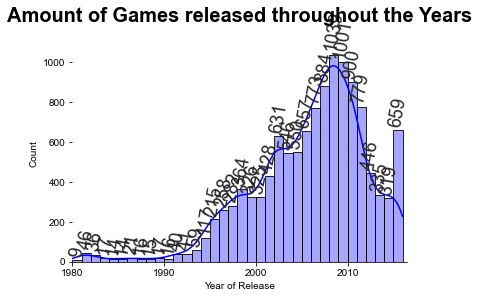

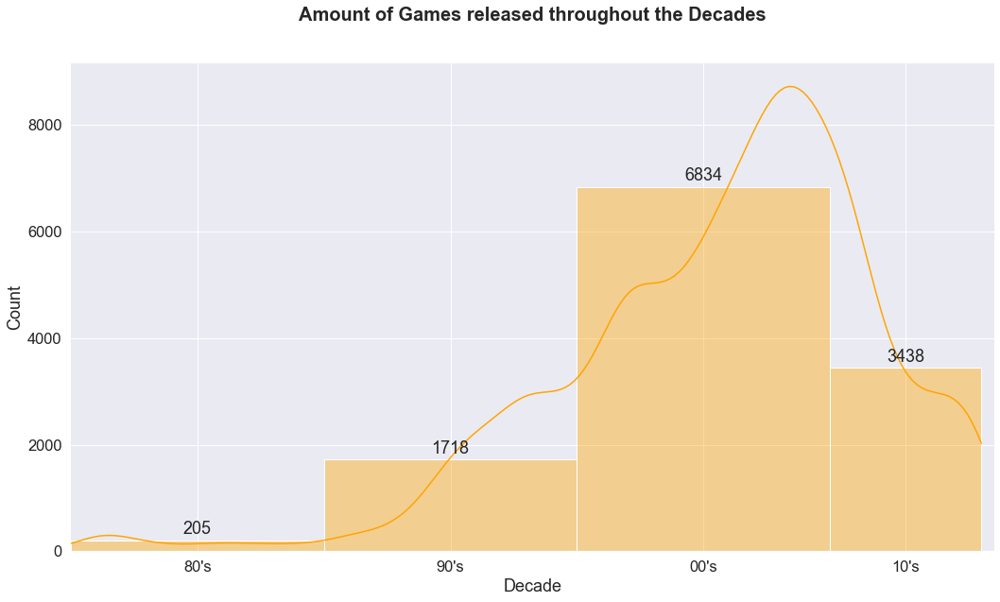

Some statistics:
Amount of games released in the last milenia (before 2000): 1923
The share of the games released in the last milenia in the data: 11.69%


In [34]:
## Plotting 2 plots to show the amounts of released games throughout the years and throughout each decade:
# -------------------------------------------------------------------------------------------------------------------------
# -------------------------------------------------------------------------------------------------------------------------
# A) Plot amount of released games through all of the 36 documented years in the data -
ax = sns.histplot(data=unique_games, bins=36, x='year_of_release', kde=True, color='blue', alpha=0.35)

# Plot modifications -
plt.xlim(1980,2016.5), plt.xlabel('Year of Release')
sns.despine(left=True)
sns.set(font_scale=1.5, rc = {'figure.figsize':(17.5,9.5)})
plt.title('Amount of Games released throughout the Years',\
          fontdict = {'fontsize':20, 'fontweight':'bold'}, y=1.075)
for item in ax.bar_label(ax.containers[0], padding = 1.75): item.set_rotation(80)

# Show plot -
plt.show()
# -------------------------------------------------------------------------------------------------------------------------
# B) Plot amount of released games through each decade (2010 to 2016 is considered a decade in here) -
bins_list = [1980,1990,2000,2010,2016]
ax = sns.histplot(data=unique_games, bins=bins_list, x='year_of_release', kde=True, color='orange', alpha=0.4)

# Plot modifications -
plt.xlim(1980,2016.5), plt.xticks(ticks=[1985,1995,2005,2013], labels=["80's","90's","00's","10's"]);
plt.xlabel('Decade');
sns.despine(left=True)
sns.set(font_scale=1.5, rc = {'figure.figsize':(17.5,9.5)})
plt.title('Amount of Games released throughout the Decades',\
          fontdict = {'fontsize':20, 'fontweight':'bold'}, y=1.075)
ax.bar_label(ax.containers[0], padding = 2.75)

# Show plot -
plt.show()

# Printing some stats -
last_milenia_games = unique_games.query('year_of_release < 2000')
print(f'\033[1m\x1b[4mSome statistics\x1b[0m:\n\
Amount of games released in the last milenia (before 2000): {len(last_milenia_games)}\n\
The share of the games released in the last milenia in the data: {len(last_milenia_games)/len(games):.2%}')

We can see that out of the 16.4k games in the data, there are just 1923 games that were created until the year 2000, with a mere 205 games (nearly 11.7% of them, and 1.7% of the whole data) released in the 80's (i.e. between 1980 to 1990); The amount of games released in the last milenia's represents just 11.69% of all games in the data, having a relatively small representation compared to the post-milenia' years (i.e. 2000 to 2016). It can be observed that there was a rise in released games since 1995 that stopped sometime in the 2008/09 year and then faded until 2014/15, but there is a rise in the latest 2015/16 year. Since the 10's decade has not ended yet, at time of data gathering, we can assume numbers will rise until the decade's end.

#### *Conclusion:*

The data from the pre-00's (1980-2000) is just a bit under 11.7% of the total data, underepresenting the "last milenia" period. The years from 2010 forward are representing a little over a quarter of the data, while the 00's decade has the largest representation.

*In case we'll need to analyze anything by time periods later, the fairest way will be to look at the time periods as:*
- 1980 to 2000. 
- 2000 to 2010. 
- 2010 to 2016.

-----------------------------------------

## 5.2 Studying different platforms' sales

We'll look at how sales varied from platform to platform. After that I'll choose the platforms with the greatest total sales and build a distribution based on data for each year. We'll find platforms that used to be popular but now have zero sales and check how long does it generally take for new platforms to appear and old ones to fade.

### 5.2.1 All-time sales per platform

Let's begin by plotting the all-time sales per platform for the games in the data:

Some stats:
The average all time Ice games' sales of a platform: $284.335M
The median all time Ice games' sales of a platform: SNES $200.04M


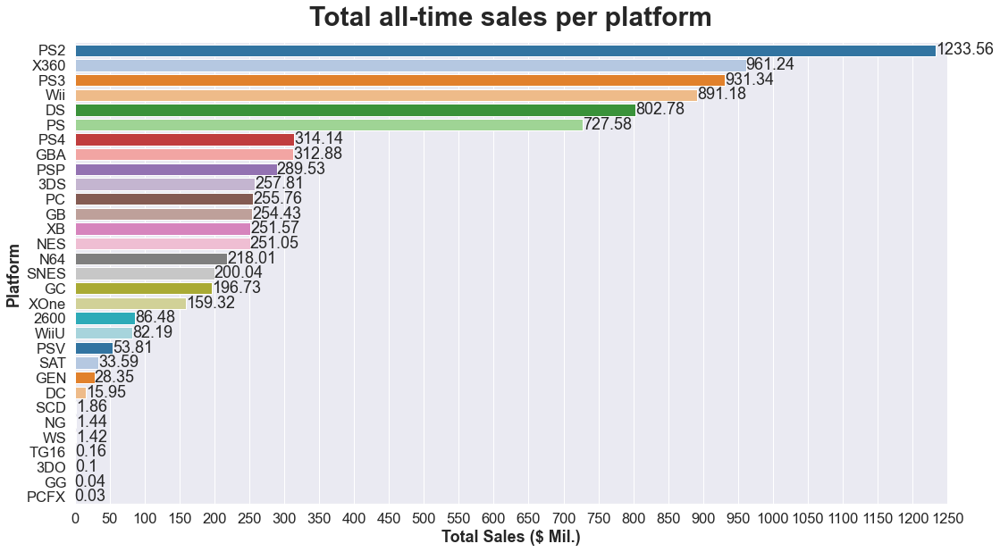

In [35]:
# Creating a total all-time sales per platform for the games in the data -
sales_per_plat = games.pivot_table(values='total_sales', index='platform', aggfunc='sum')

# Printing some stats -
print(f'\033[1m\x1b[4mSome stats\x1b[0m:\n\
\033[1m\x1b[1mThe average all time Ice games\' sales of a platform:\x1b[0m \
${round(sales_per_plat.mean()[0], ndigits=3)}M\n\
\033[1m\x1b[1mThe median all time Ice games\' sales of a platform:\x1b[0m SNES \
${round(sales_per_plat.median()[0], ndigits=3)}M')

# Creating a plotting order 
# to show platforms from the most profitable to the least profitable -
order_to_plot = sales_per_plat.sort_values('total_sales', ascending=False).index

# Plotting the all-time sales per platform -
ax = sns.barplot(data=sales_per_plat, y=sales_per_plat.index, x='total_sales',\
           palette='tab20', order=order_to_plot)

# Adding bar labels -
ax.bar_label(ax.containers[0])
    
# Setting custumized modification parameters:
plt.title('Total all-time sales per platform',\
          fontdict = {'fontsize':30, 'fontweight':'bold'}, y=1.025)
sns.despine(left=True)
sns.set(font_scale=1.3, style='whitegrid', rc = {'figure.figsize':(17.5,10.5)})
plt.xlim(0,1250), plt.xticks(range(0,1300,50));
plt.xlabel('Total Sales ($ Mil.)', fontdict = {'fontsize':18, 'fontweight':'bold'}), \
plt.ylabel('Platform', fontdict = {'fontsize':18, 'fontweight':'bold'});

# Show plot -
plt.show()

#### *Conclusion regarding all-time sales per platform:*

The most profitable platform all-time for Ice games, by a big distance, was the PS2, followed by the Xbox 360 (i.e. `'X360'`) and the PS3. There are just 6 platforms that passed the 315M dollar all-time mark. The median all-time sales for a platform is the `'SNES'` 200.04M dollar, and the average all-time sales of Ice games on a specific platform is 284.335M dollar, while the top 6 are definitely pulling the average above.

### 5.2.2. All time global sales dispersion between platforms

Let's create boxplots of each platform\'s all-time global sales:

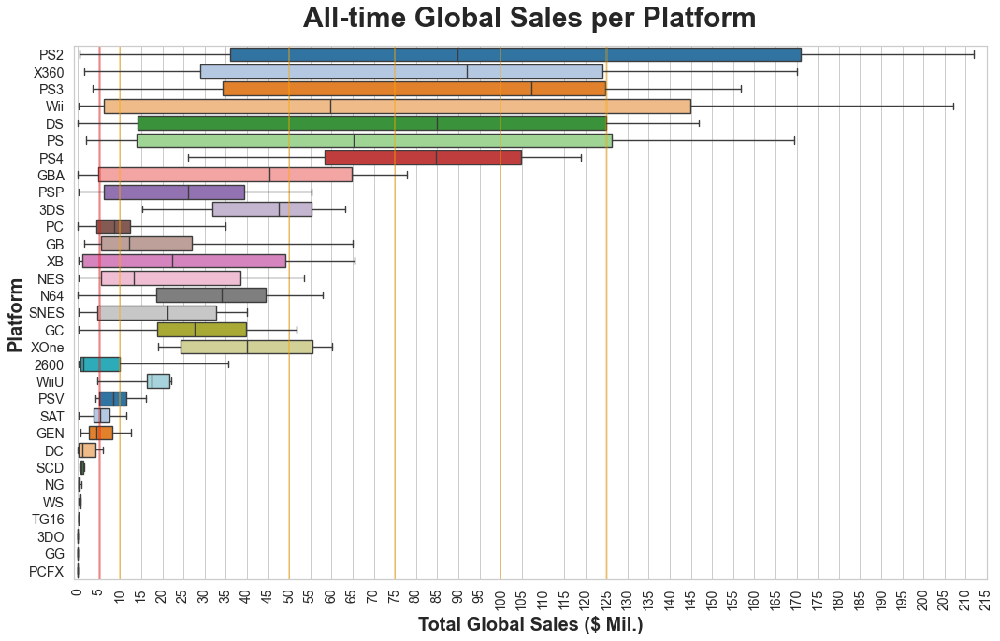

Some stats for the platforms' sales leaders:

PS2 platform:
	Variance: 6305.27
	STD: 79.41

X360 platform:
	Variance: 3304.46
	STD: 57.48

PS3 platform:
	Variance: 2985.26
	STD: 54.64

Wii platform:
	Variance: 6262.56
	STD: 79.14

DS platform:
	Variance: 3803.58
	STD: 61.67

PS platform:
	Variance: 4013.44
	STD: 63.35



In [36]:
# Adding lines showing separation between each decade -
plt.axvline(10,0,1, c='orange', alpha=0.55), plt.axvline(50,0,1, c='orange', alpha=0.55);
plt.axvline(75,0,1, c='orange', alpha=0.55), plt.axvline(100,0,1, c='orange', alpha=0.55);
plt.axvline(5,0,1, c='red', alpha=0.3, linewidth=3), plt.axvline(125,0,1, c='orange', alpha=0.3, linewidth=3);

# Creating a plotting order 
# to show platforms from the most profitable to the least profitable -
order_to_plot = sales_per_plat.sort_values('total_sales', ascending=False).index

# Plotting a boxplot for the all-time global sales per platform -
ax = sns.boxplot(data=unique_plats, x='total_sales', y='platform', \
            linewidth=1.4, fliersize=10, whis=18, palette='tab20', order=order_to_plot)

# Setting customized modification parameters for plot:
plt.title('All-time Global Sales per Platform',\
          fontdict = {'fontsize':30, 'fontweight':'bold'}, y=1.025)
sns.set(font_scale=1.3, style='whitegrid', rc = {'figure.figsize':(17.5,10.5)})
# Mods for ticks and labels -
plt.xlim(-1,215), plt.xticks(range(0,220,5), rotation=90, size=14);
plt.xlabel('Total Global Sales ($ Mil.)', fontdict = {'fontsize':20, 'fontweight':'bold'}, labelpad=6.5);
plt.ylabel('Platform', fontdict = {'fontsize':20, 'fontweight':'bold'});
# Show plot -
plt.show()

# Printing some stats -
print('\033[1m\x1b[4mSome stats for the platforms\' sales leaders\x1b[0m:\n')
for p in ['PS2', 'X360', 'PS3', 'Wii', 'DS', 'PS']:
    var = unique_plats[unique_plats['platform']==p]['total_sales'].var()
    std = unique_plats[unique_plats['platform']==p]['total_sales'].std()
    print(f'\033[1m\x1b[4m{p} platform\x1b[0m:\n\t\
\033[1m\x1b[1mVariance:\x1b[0m {var:.6}\n\t\033[1m\x1b[1mSTD:\x1b[0m {std:.4}\n')

We can see that the `'PS2'` and the `'Wii'` platforms had the greatest variances between the platforms by a distance, ~6305 and ~6262 (accordingly), while both their boxplots' whiskers are touching or getting close to touch the limits. Both platforms are right skewed, but the key differences are within their boxplots quartile positions; The `'Wii'` 3rd quartile sits at slightly below 145M dollars, the `'PS2'` 3rd quartile reached a little over 170M dollars, on the same side of the wall, the `'Wii'` 1st quartile almost reaches the 10M dollars red line, and the `'PS2'` 1st quartile reached slightly over 35M dollars. The median sales value of the `'PS2'` is 90M dollars and the median sales value of the `'Wii'` is 60M.

#### ***Conclusion regarding dispersion of the global sales per platform:***

Adding all that together shows that although variances are really close and sales have spreaded all along the ladder - the `'PS2'` had more high-selling years than the `'Wii'`, although the latter has reached the `'PS2'` numbers in some occasions.

### 5.2.3 Sales over the years for the top-4 platforms

First, we'll create 2 DFs:
- **`top4`** - We'll filter the data to contain only games that were released on the top 4 platform - `'PS2'`, `'X360'`, `'PS3'` and `'Wii'`.
- **`top4_sales_p_y`** - Using the first filtered DF, we'll create a separate pivot table representing the amount of sales each platform made per year.

In [37]:
# A) Creating a filtered DF that contain sales only for the top 4 platforms -
top4 = games[(games['platform'] == 'PS2') |
            (games['platform'] == 'X360') | 
            (games['platform'] == 'PS3') |
            (games['platform'] == 'Wii')].reset_index(drop=True)

# ------------------------------------------------------------------------------------------------------------------------
# B) Making the `top4_sales_p_y` pivot table out of the filtered DF
# to sum sales per year for each platform per active years-
top4_sales_p_y = top4.pivot_table(values='total_sales', index=['platform','year_of_release'], aggfunc='sum')\
.query('platform =="PS2" | platform=="X360" | platform=="PS3" | platform=="Wii"')

# Flattening Double Index -
flat_DoubleIdx(top4_sales_p_y,'platform','year_of_release', reorder=True)

# Getting rid of rows where the platforms didn't make sales -
top4_sales_p_y['total_sales'].replace(0,np.nan, inplace=True)
top4_sales_p_y.dropna(inplace=True)
# ------------------------------------------------------------------------------------------------------------------------
# C) Printing some stats:
# Print a `platform` value counts -
print('\033[1m\x1b[4mDistribution of games between platforms\' sales leaders\x1b[0m:\n',\
      top4['platform'].value_counts()[:4], sep='');

# Print each platform lifetime -
top4plats= ['PS2','X360','PS3','Wii']
print('\n\033[1m\x1b[4mTop 4 Platforms\' Lifetime\x1b[0m:')
for p in top4plats:
    print(f"\033[1m\x1b[1m{p}\x1b[0m: \
{games[games['platform'] == p]['year_of_release'].min()}-{games[games['platform'] == p]['year_of_release'].max()}")

print('\n\033[1m\x1b[4mDescription of the top 4 platforms\' sales per year\x1b[0m \
\033[1m\x1b[1m(`top4_sales_p_y` DF)\x1b[0m:', end='')
display(top4_sales_p_y.describe())

Distribution of games between platforms' sales leaders:
PS2     2127
PS3     1305
Wii     1286
X360    1232
Name: platform, dtype: int64

Top 4 Platforms' Lifetime:
PS2: 2000-2011
X360: 2005-2016
PS3: 2006-2016
Wii: 2006-2016

Description of the top 4 platforms' sales per year (`top4_sales_p_y` DF):

,year_of_release,total_sales
count,46.000000,46.000000
mean,2009.434783,87.333043
std,4.107728,67.032165
min,2000.000000,0.180000
25%,2007.000000,21.147500
50%,2009.500000,91.995000
75%,2012.750000,140.915000
max,2016.000000,211.810000


We can see that the 4 platforms data ranges from 2000 to 2016. While `'PS2'` is the oldest platform and already depreciated in 2011, all the other platforms are still active at 2016 - the Xbox 360 platform (`'X360'`) has been released in 2005 and the `'PS3'` and `'Wii'` platforms were released in 2006. Max sales have reached 211.81M dollar, while the minimum is 0.18M dollar.
The average yearly sales was 87.33M dollars.

Now let's build a distribution for the top 4 platforms sales over the years:

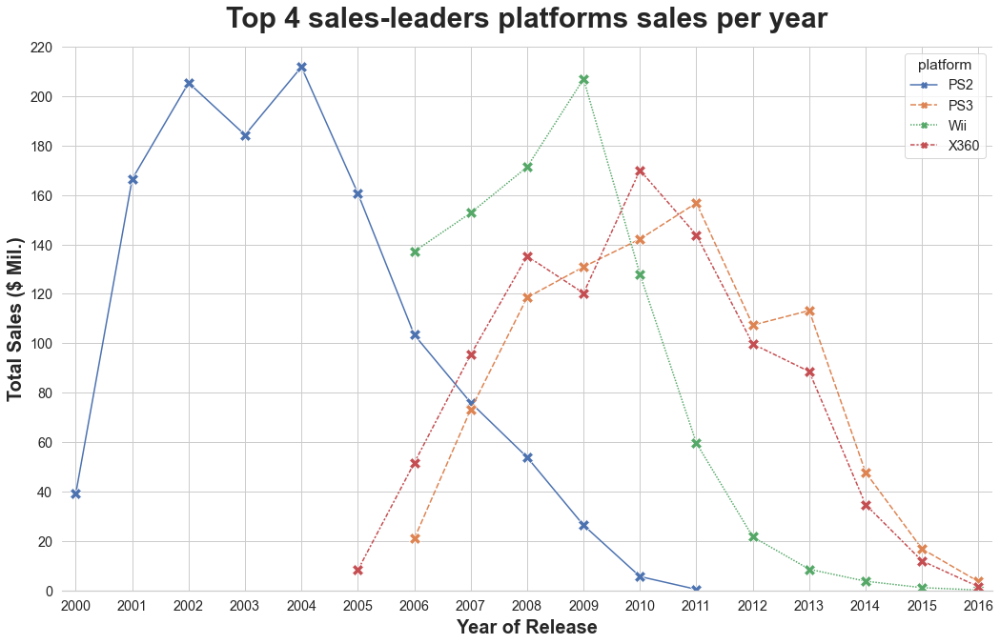

In [38]:
# Setting customized markers
M = mrk.MarkerStyle(marker="X", fillstyle='full')

# Plotting sales per year for the top 4 sales-leaders platforms -
sns.lineplot(data=top4_sales_p_y, x='year_of_release', y='total_sales', \
             hue='platform', style='platform', markers=[M,M,M,M], ms=12)

# Setting custumized modification parameters:
plt.title('Top 4 sales-leaders platforms sales per year',\
          fontdict = {'fontsize':30, 'fontweight':'bold'}, y=1.025)
sns.set(font_scale=1.65, style='whitegrid', rc = {'figure.figsize':(18.5,9)})
sns.despine(left=True, top=True)
plt.xlim(1999.75,2016.25), plt.xticks(range(2000,2017,1));
plt.ylim(0,220,20), plt.yticks(range(0,240,20))
plt.xlabel('Year of Release', fontdict = {'fontsize':20, 'fontweight':'bold'}, labelpad=6.5);
plt.ylabel('Total Sales ($ Mil.)', fontdict = {'fontsize':20, 'fontweight':'bold'});

# Show plot -
plt.show()

If you'll look in the plot above closely  you could spot a trend for each individual platform - ***excluding the* `'Wii'` *platform, for now*** - each of other 4 platforms had a pretty sharp slope above at the first 3 or 4 years, then maybe had a little slowdown for a year, and after that kept rising until reaching the sales peak at year 5 to 6. After 5 or 6 years since release, the platforms began dropping in numbers up until reaching less than 10M dollars at about year 10 or 11. 

Adding all that to the fact the `'PS2'` depreciated after 11 years in 2011, we can pretty much say **each of the top selling platforms have about 10 to 11 years before depreciating from the market**, while less selling platforms might last for even less. Each platform lasted between 5 to 7 years after decreasing from it's peak yearly sales. As it looks like, the Xbox 360 ('`X360'`) and the `'PS2'` have about a year before depreciating from the market too, so even though they were top-selling, it's not worth releasing new games to them anymore.

On the other hand, unlike the other 3 platforms, ***the* `'Wii'` *platform shows us a different-ish behaviour of a "Trend" platform;*** It reached it's peak almost right away, after just 3 years, and then decreased in sales pretty sharply, but still stayed 7 years in the market before before depreciating. Nevertheless, the platform dropped under the 10M dollars mark just 4 years after getting to it's sales peak. The behaviour of the `'Wii'` platform sales can be explained by that the platform was a revolutionary platform, as the developers turned to a different market segment than the rival platforms at the time with their wireless controller - The hype created upon the `'Wii'` platform release was higher than usual, as can be seen looking at the first year sales for each platform in the graph. Nevertheless, each trend is destined to be broken and each bubble to be popped, which pretty much explain the delayed depreciation of the platform, because just looking solo at the graph is telling us that the platform is most definitely depreciated already and won't have sales in 2017.

#### ***Conclusion regarding sales over the years for the top-4 platforms:***

**There's a common behaviour that all the top selling platforms above share:** It takes a solid platform 3 to 4 years to get to it's peak years, and a max of 5 to 6 years to reach the peak-sales year, meaning the peak years last for about 1 to 3 years. After dropping from the peak-sales the platform leaves the "peak years" and starts to fall in sales numbers, it takes a platform about 5 to 7 years to stop making sales and depreciating from the market, or to be precise - 10 to 11 years since it's release.

There are some changes between platforms, but the general behaviour remain the same.

### 5.2.4 Time taking for platforms to appear and depreciate

Now we'll check how much time it take for new platforms to appear and disappear from the market:

In [39]:
# Creating a function that places the last column in the beginning of the DF -
def last_to_first(df):
    '''
    The last_to_first() function place the last column in the beginning of the DataFrame.
    '''
    col_name = df.iloc[:,-1].name
    cols = df.columns
    cols = cols.insert(0,col_name)
    return df.reindex(columns=cols).iloc[:,:-1]

# Creating a DF that show the lifetime range of each platform -
range_per_plat = games.pivot_table(values='year_of_release', index='platform', aggfunc=['min','max'])

# Unstacking the columns' MultiIndex -
range_per_plat = range_per_plat.stack()

# Flattening the index -
flat_DoubleIdx(range_per_plat,'platform','',drop_one=True)

# Placing the former-index column in the beginning of the DF -
range_per_plat = last_to_first(range_per_plat)

# Adding the `lifespan` column that represent the amount of years the platform stayed on the market.
# P.S. The plus 1 at the end will represent the following year (i.e. `max`), as there were still sales that year -
range_per_plat['lifespan'] = range_per_plat['max'] - range_per_plat['min'] + 1

# Adding the `active_years` of each platform,
# which are the amount of years where each platform has made sales during it's lifespan -
active_years = {} # Creating a counter
for p in unique_plats['platform']: # Adding only the amount of years which each platform made sales on
    active_years[p] =len(np.array(unique_plats.query("platform==@p & total_sales!=0")['year_of_release']))
# Creating the column from the `active_years` dictionary -
range_per_plat['active_years'] = range_per_plat['platform'].map(active_years) 

# Adding the `activity_ratio` column,
# Which shows the percentage of years the platform has been active in it's lifespan -
range_per_plat['activity_ratio'] = round(range_per_plat['active_years'] / range_per_plat['lifespan'], ndigits=3)

# Adding the `total_sales` column from the `sales_per_plat` DF we created before -
range_per_plat = range_per_plat.merge(sales_per_plat[['total_sales']],on=range_per_plat['platform']).iloc[:,1:]

# Adding the `sales_per_year_lifespan` column,
# which shows average sales per year through entire lifespan of a platform -
range_per_plat['sales_per_year_lifespan'] = round(range_per_plat['total_sales'] / range_per_plat['lifespan'], ndigits=3)

# Adding the `sales_per_active_year` column,
# which shows the mean sales per years the platform was active -
range_per_plat['sales_per_active_year'] = round(range_per_plat['total_sales'] / range_per_plat['active_years'], ndigits=3)

# Adding the `100pct_active_sales_forecast` column,
# which states the projection for total sales if the platform would've been active every year -
range_per_plat['100pct_active_sales_forecast'] = \
round(range_per_plat['sales_per_active_year'] * range_per_plat['lifespan'], ndigits=2)

# Displaying a sample of the DF -
range_per_plat.head(5)

,platform,min,max,lifespan,active_years,activity_ratio,total_sales,sales_per_year_lifespan,sales_per_active_year,100pct_active_sales_forecast
0,2600,1980,1989,10,10,1.000,86.48,8.648,8.648,86.48
1,3DO,1994,1995,2,2,1.000,0.10,0.050,0.050,0.10
2,3DS,2011,2016,6,6,1.000,257.81,42.968,42.968,257.81
3,DC,1998,2008,11,7,0.636,15.95,1.450,2.279,25.07
4,DS,1985,2013,29,11,0.379,802.78,27.682,72.980,2116.42


We created the `last_to_first()` function in order to get the lifespan ranges for each platform. We've also added to the DF the following columns:
- `lifespan` - The column shows the amount of years the platform has been on the market until depreciating.
- `active_years` - The column shows the total number of active years, where the platform had sales during it's lifetime.
- `total_sales` (from the `sales_per_plat` DF we made before)
- `sales_per_year_lifespan` - Average sales per lifespan years.
- `sales_per_active_year` - The column shows the average sales per an active year.
- `100pct_active_sales_forecast` - The column shows a projection for total sales for the platform if it kept selling at the same average sales every year in their lifespan. Platforms that have a 100% activity ratio will show the same number as in `total_sales`.


We can already see that the Nintendo `'DS'` platform is active only in a third of it's lifetime, which could be explained by that it must have returned after a few years since it's a retro platform, as we'll verify soon in the following graph.

Now let's use the created data in order to plot the dispersion of platform's lifespan through time:

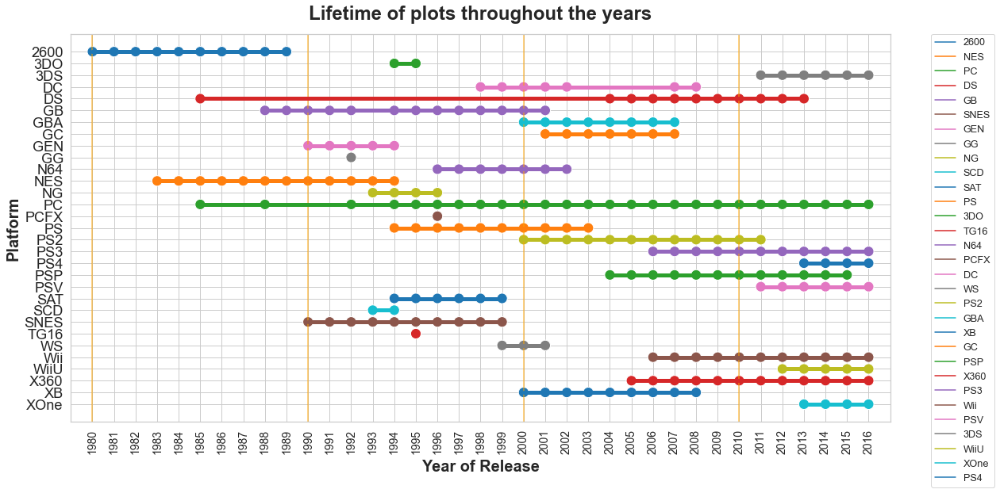

A) Some stats:

General Statistics:
Amount of platforms made in the past 4 years (2012-2016): 3 platforms
0 platforms died in less than a year (Only in the 90's)
The average lifespan of a platform: 8.6 years
The average lifetime (`active_years`) of a platform: 7.7 years

Average Lifespan statistics per era:
*  Average lifespan has decreased in 7.4% from last milenia to the new milenia.
The average lifespan for consoles made-
	In the last milenia (1980-2000): 8.9 years
	In the new milenia (2000-): 8.2 years
	In the 80's (With the PC): 19.4 years
	In the 80's (Without the PC): 16.25 years
	In the 90's (With platforms that died in a year): 4.8 years
	In the 90's (Without platforms that died in a year): 6.0 years
	In the 00's: 10.25 years

Average lifetime (`active_years`) statistics per era:
*  Average activity years or "lifetime" has rised in 13.1% from last milenia to the new milenia.
The average lifetime for consoles made-
	In the last milenia (1980-2000): 7.3 years
	In the new milenia

,platform,min,max,lifespan,active_years,activity_ratio,total_sales,sales_per_year_lifespan,sales_per_active_year,100pct_active_sales_forecast
13,PC,1985,2016,32,26,0.812,255.76,7.992,9.837,314.78
5,GB,1988,2001,14,13,0.929,254.43,18.174,19.572,274.01
11,NES,1983,1994,12,12,1.000,251.05,20.921,20.921,251.05
28,X360,2005,2016,12,12,1.000,961.24,80.103,80.103,961.24
19,PSP,2004,2015,12,12,1.000,289.53,24.128,24.128,289.54
16,PS2,2000,2011,12,12,1.000,1233.56,102.797,102.797,1233.56



-------------------------------------------------------------------------------------------------------------------------


C) Displaying platforms with longest lifetime:

,platform,min,max,lifespan,active_years,activity_ratio,total_sales,sales_per_year_lifespan,sales_per_active_year,100pct_active_sales_forecast
13,PC,1985,2016,32,26,0.812,255.76,7.992,9.837,314.78
4,DS,1985,2013,29,11,0.379,802.78,27.682,72.980,2116.42
5,GB,1988,2001,14,13,0.929,254.43,18.174,19.572,274.01


Sales sums for the `PC` platform:
na_sales        93.34
eu_sales       140.37
jp_sales         0.17
other_sales     21.88
total_sales    255.76
dtype: float64

Sales sums for the `DS` platform:
na_sales       380.31
eu_sales       188.41
jp_sales       175.02
other_sales     59.04
total_sales    802.78
dtype: float64

Sales sums for the `GB` platform:
na_sales       113.64
eu_sales        47.51
jp_sales        85.12
other_sales      8.16
total_sales    254.43
dtype: float64

-------------------------------------------------------------------------------------------------------------------------


D) Displaying all current decade's new platforms, sorted by the newest to oldest:

,platform,min,max,lifespan,active_years,activity_ratio,total_sales,sales_per_year_lifespan,sales_per_active_year,100pct_active_sales_forecast
18,PS4,2013,2016,4,4,1.0,314.14,78.535,78.535,314.14
30,XOne,2013,2016,4,4,1.0,159.32,39.830,39.830,159.32
27,WiiU,2012,2016,5,5,1.0,82.19,16.438,16.438,82.19
2,3DS,2011,2016,6,6,1.0,257.81,42.968,42.968,257.81
20,PSV,2011,2016,6,6,1.0,53.81,8.968,8.968,53.81


In [40]:
# A) We'll need to add more data to plot the ranges of lifetime for the platforms:
# Filtering the data to show only each platform's unique years -
years_per_plats = last_to_first(games[['year_of_release', 'platform']]).sort_values('year_of_release',\
                                                                                   ascending=False).drop_duplicates()

# -------------------------------------------------------------------------------------------------------------------------
# B) Creating subplots:
# 1. Creating a plotting order 
# to show platforms from the most profitable to the least profitable -
order_to_plot = years_per_plats.sort_values('year_of_release', ascending=True)['platform'].unique()

# 2.1 Creating the first subplot,
# that represents active years of each platform -
fig, ax1 = plt.subplots()
# 2.2 Adding lines showing separation between each decade -
plt.axvline(1980, 0,1, c='orange', alpha=0.65), plt.axvline(1990, 0,1, c='orange', alpha=0.65)
plt.axvline(2000, 0,1, c='orange', alpha=0.65), plt.axvline(2010, 0,1, c='orange', alpha=0.65)
# 2.3 Plotting the the active years of each platform -
ax = sns.scatterplot(data=years_per_plats, y='platform', x='year_of_release', palette='tab10',\
                      hue='platform', hue_order=order_to_plot, sizes='platform',\
                      markers=True, s = 175, legend=False)

# 3. Creating the second subplot,
# that represents lifetime of each platform -
ax2 = sns.lineplot(data=years_per_plats, y='platform', x='year_of_release', palette='tab10',\
                  hue='platform', hue_order=order_to_plot, sizes='platform',\
                  markers=True, linewidth = 5)

# -------------------------------------------------------------------------------------------------------------------------
# C) Setting custumized modification parameters for subplots:
plt.title('Lifetime of plots throughout the years',\
          fontdict = {'fontsize':24, 'fontweight':'bold'}, y=1.025)
sns.set(font_scale=1.15, style='whitegrid', rc = {'figure.figsize':(12.5,12)})
# Mods for ticks and labels -
plt.xlim(1979,2017), plt.xticks(range(1980,2017,1), rotation=90, size=14);
plt.xlabel('Year of Release', fontdict = {'fontsize':20, 'fontweight':'bold'}, labelpad=6.5);
plt.ylabel('Platform', fontdict = {'fontsize':20, 'fontweight':'bold'});
# Mods for legend
plt.legend(bbox_to_anchor=(1.05, 1.0), loc='upper left', borderaxespad=0)

# Show subplots -
plt.show()

# -------------------------------------------------------------------------------------------------------------------------
# D) Printing some stats:
# General stats -
new_plats = len(range_per_plat[(range_per_plat['min'] >= 2012)])
died_in_a_year = len((range_per_plat[range_per_plat['lifespan'] == 0]))
# Average lifespan stats -
last_mil = range_per_plat[(range_per_plat['min'] < 2000)]['lifespan'].mean()
new_mil = range_per_plat[2000 <= range_per_plat['min']]['lifespan'].mean()
the_80s = range_per_plat[(range_per_plat['min'] < 1990) & (range_per_plat['platform'] != 'PC')]['lifespan'].mean()
all_80s = range_per_plat[(range_per_plat['min'] < 1990)]['lifespan'].mean()
the_90s = range_per_plat[(2000 > range_per_plat['min']) & (range_per_plat['min'] >= 1990) \
                         & (range_per_plat['lifespan'] != 1)]['lifespan'].mean()
all_90s = range_per_plat[(2000 > range_per_plat['min']) & (range_per_plat['min'] >= 1990)]['lifespan'].mean()
the_00s = range_per_plat[(2010 > range_per_plat['min']) & (range_per_plat['min'] >= 2000)]['lifespan'].mean()


# Average lifetime (`active_years`) stats -
act_yrs_last_mil = range_per_plat[(range_per_plat['min'] < 2000)]['active_years'].mean()
act_yrs_new_mil = range_per_plat[2000 <= range_per_plat['min']]['active_years'].mean()
act_yrs_all_80s = range_per_plat[(range_per_plat['min'] < 1990)]['active_years'].mean()
act_yrs_the_80s = range_per_plat[(range_per_plat['min'] < 1990) & (range_per_plat['platform'] != 'PC')]['active_years'].mean()
act_yrs_all_90s = range_per_plat[(2000 > range_per_plat['min']) & (range_per_plat['min'] >= 1990)]['active_years'].mean()
act_yrs_the_90s = range_per_plat[(2000 > range_per_plat['min']) & (range_per_plat['min'] >= 1990) \
                         & (range_per_plat['active_years'] != 1)]['active_years'].mean()
act_yrs_the_00s = range_per_plat[(2010 > range_per_plat['min']) & (range_per_plat['min'] >= 2000)]['active_years'].mean()

print(f"A) \033[1m\x1b[4mSome stats\x1b[0m:\n\n\033[1m\x1b[1mGeneral Statistics:\x1b[0m\n\
Amount of platforms made in the past 4 years (2012-2016): {new_plats} platforms\n\
{died_in_a_year} platforms died in less than a year (Only in the 90\'s)\n\
The average lifespan of a platform: {range_per_plat['lifespan'].mean():.2} years\n\
The average lifetime (`active_years`) of a platform: {range_per_plat['active_years'].mean():.2} years\n\n\
\033[1m\x1b[1mAverage Lifespan statistics per era:\x1b[0m\n\
*  Average lifespan has decreased in {1- new_mil/last_mil:.1%}\
 from last milenia to the new milenia.\n\
The average lifespan for consoles made-\n\
\tIn the last milenia (1980-2000): {last_mil:.2} years\n\
\tIn the new milenia (2000-): {new_mil:.2} years\n\
\tIn the 80\'s (With the PC): {all_80s} years\n\
\tIn the 80\'s (Without the PC): {the_80s} years\n\
\tIn the 90\'s (With platforms that died in a year): {all_90s:.2} years\n\
\tIn the 90\'s (Without platforms that died in a year): {the_90s:.2} years\n\
\tIn the 00\'s: {the_00s} years\n\n\
\033[1m\x1b[1mAverage lifetime (`active_years`) statistics per era:\x1b[0m\n\
*  Average activity years or \"lifetime\" has rised in {act_yrs_new_mil/act_yrs_last_mil-1:.1%}\
 from last milenia to the new milenia.\n\
The average lifetime for consoles made-\n\
\tIn the last milenia (1980-2000): {act_yrs_last_mil:.2} years\n\
\tIn the new milenia (2000-): {act_yrs_new_mil:.2} years\n\
\tIn the 80\'s (With the PC): {act_yrs_all_80s} years\n\
\tIn the 80\'s (Without the PC): {act_yrs_the_80s} years\n\
\tIn the 90\'s (With platforms that died in a year): {act_yrs_all_90s:.2} years\n\
\tIn the 90\'s (Without platforms that died in a year): {act_yrs_the_90s:.2} years\n\
\tIn the 00\'s: {act_yrs_the_00s} years",\
      end='\n\n')
print('\n-------------------------------------------------------------------------------------------------------------------------\n')
print('B) \033[1m\x1b[4mTop 5 most active platforms in the data\x1b[0m \
\033[1m\x1b[1m(sorted by \'active_years\')\x1b[0m:', end='')
display(range_per_plat.sort_values(by='active_years', ascending=False)[:6])
print('\n-------------------------------------------------------------------------------------------------------------------------\n')
# Printing longest lifespan platforms' stats:
print('\nC) \033[1m\x1b[4mDisplaying platforms with longest lifetime\x1b[0m:', end='');
display(range_per_plat[(range_per_plat['platform'] == 'PC') | (range_per_plat['platform'] == 'DS')\
                      | (range_per_plat['platform'] == 'GB')].sort_values('lifespan', ascending=False));
print('\033[1m\x1b[1mSales sums for the `PC` platform:\x1b[0m\n',\
      unique_plats[(unique_plats['platform']=='PC')].loc[:,['na_sales', 'eu_sales', 'jp_sales',
       'other_sales', 'total_sales']].sum(), sep='', end='\n\n');
print('\033[1m\x1b[1mSales sums for the `DS` platform:\x1b[0m\n',\
      unique_plats[(unique_plats['platform']=='DS')].loc[:,['na_sales', 'eu_sales', 'jp_sales',
       'other_sales', 'total_sales']].sum(), sep='', end='\n\n');
print('\033[1m\x1b[1mSales sums for the `GB` platform:\x1b[0m\n',\
      unique_plats[(unique_plats['platform']=='GB')].loc[:,['na_sales', 'eu_sales', 'jp_sales',
       'other_sales', 'total_sales']].sum(), sep='');
print('\n-------------------------------------------------------------------------------------------------------------------------\n')
# Printing pre-peak platforms:
print('\nD) \033[1m\x1b[4mDisplaying all current decade\'s new platforms, sorted by the newest to oldest\x1b[0m:', end='');
display((range_per_plat[(range_per_plat['min'] >= 2010)].sort_values('min',ascending=False)));


#### 5.2.4-A) Analyzing the lifespan and lifetime findings from above

***How much times it takes for a new platform to enter the market?***

Looking at the data we got from the above plot, it looks like every 2 to 5 years a new platform enters the market, depending on what era we're looking at. Up until about 1990, every 2 to 3 years a new platform has entered the market. from 1990 to 2000 a new platform was released once in every 1-2 years, but in the new milenia platforms were released in further periods, as new platforms get introduced averagely every 1 to 4 years.

***Looking at the platforms lifespan and lifetime throughout the years***

Speaking general lifespan, it looks like the 80's platforms really were the best long-term platforms yet, averaging 16.25 years before depreciating, and that's ***without*** the PC included in the calculations, which alone raise lifetime to 19.4 years. In the 90's, by contrast, the average lifetime of a released platform was dropped to 4.8 years, as there were 3 platforms that actually died in a year or less only in the 90's, while without these platforms, the average lifespan stood at 6 years. Platforms released in the new milenia, from 2000 up until 2010, have a lifespan of averagely 10.25 years before depreciating, which is pretty correlated when compared to our prior findings in the section we explored the platforms who were the top 4 sales leaders (as they all were released in the 00's). Overall lifespan has ***decreased in 7.4%*** since last milenia to the new one, from 8.9 to 8.2 years.

On the contrary, if we speak about general lifetime, i.e. the years a platform was active and has made sales from it's release to it's depreciation, the whole story changes. The 80's released platforms have been active for about 14.4 years out of the 19.4 years while counting the PC in the calculations, and 11.5 out of 16.25 years while excluding it. The platforms released in the 90's have been active for about 4.5 out of their 4.8 years lifespan, while when we exculded the platforms which died in a year or less the activity years are rising a little to 5.6 out of 6 years. Meanwhile, all of the platforms released in the new milenia's first decade have been active through all of their lifespan, meaning they had a change in behaviour. Overall life activity years (i.e. lifetime) had rised between the milenias, from 7.3 active years on the last milenia ***up 13.1%*** to 8.2 years of activity in the new milenia.

***Checking the platforms which survived the most & the platforms whose been active the longest***

The platforms which lived the longest lifespan are the `'PC'` (32 years) and the Nintendo `'DS'` (29 years), while the Nintendo DS is passing the PC in sales by miles, the PC has out-timed the Nintendo DS, which has already depreciated in 2013. That could be explained by that the PC was not meant directly for games, and the `'DS'` does.

Nevertheless, after checking the platforms leading in activity years, we found that the most active platforms throughout the years were (by order):
1. The `'PC'`, active 26 out of the 32 years, with an activity ratio of 81.2%.
2. The Gameboy (i.e. `'GB'`), active 13 out of 14 years, with an activity ratio of 92.9%.
3. Tied in the third place with an activity ratio of 100% for 12 years - the `'NES'`, `'X360'`, `'PS2'` and the `'PSP'` platforms.

The PC platform is active for so long and we know that it'll stay because it had became the people's default, as computers themselves will not dissappear in the near future. the Gameboy had the longest road overall, having an appearant year without sales in the data in the middle of it's lifespan. Because of that technicality, we can even say it survived 14 years because it could possibly be considered an abnormality in the data, or maybe the company just didn't made games for them at that year. At third place we can see both the Xbox 360 (`'X360'`), Playstation 2 (`'PS2'`) and Playstation Portable (`'PSP'`) along with the Nintendo `'NES'` from last milenia, which was the only platform from the 80's to survive that long with 100% activity ratio. The `'PS2'` and the `'PSP'` platforms have already depreciated in 2011 and 2015 accordingly, while the `'X360'` is expected to depreciate in the following year, according to our prior analysis on the top selling platforms section. The `'DS'` platform has an activity ratio of 37.9% while it has been active for 11 out the 29 years lifespan it had, explained by that it re-entered the market as a "retro" platform after some years had passed. Nevertheless, if the `DS'` would've been active more often, it could've outperform the PS2 in sales.


#### **Conclusions regarding lifespan and activity lifetime***

I arrived to the following conclusions regarding the survivability of platforms after looking at the data:
1. ***A normal platform released in the 80's has about 10 to 12 active years tops before depreciation:***
    - It can be fairly said that although the old platforms seems to have a longer lifespan, it's often an illusion, because a platform that lasted more than a 10 to 12 years that was released before the year 2000 was most probably inactive for a few years in it's lifespan. Meaning **the activity years in both eras are actually pretty close**, if we compare these to the platforms from post-2000 and exclude the platforms released in the 90's from conversation.
2. ***Platforms in the new milenia act differently:***
    - Average lifetime for platforms released in the 00's decade is 10.25 years with a 100% activity ratio, giving a hopefull forecast that the trend continues.
3. ***Activity ratio per lifespan in higher in the new milenia:***
    - It takes about 1 to 5 years for a new platform to enter the market in the new milenia, but the platforms have more chances to be active, lasting longer and have are active for **every year** until their depreciation.


#### 5.2.4-B) Analyzing the best platforms to choose for the future from the findings above

***Regarding the future***

There are 3 pre-sales-peak platforms (first 3 to 4 years) in the market right now - the `'PS4'` and the `'XOne'`, which are newest as both are just 3 years in the market, and the `'WiiU'` which is 4 years at the market. The `'3DS'` and `'PSV'` platforms were also released in the last years, but are currently 1 or 2 years before leaving their peak, losing hype and start dropping in sales until depreciation.

The best-looking new platform in terms of sales per years out of the 5 platforms is the `'PS4'` platform, selling averagely 78.535M dollars a year in 4 years, and it is, by far, the best option for thenext few years if we want to increase sales.

Following the first place are the `'3DS'` platform who sells averagely almost ~42.97M dollar a year in the last 6 years and the `'XOne'` platform which sold averagely 39.83M dollars a year in the last 4 years. The data actually shows some better odds for sticking with the `'3DS'` platform than the `'XOne'` platform, since it most probably started selling higher than most platforms - so even if we'll get just 1 to 2 years with it we might still get more yearly sales than going with the `'XOne'`. Nevertheless, the `'3DS'` is soon to decrease in sales, and there's a chance that the `'XOne'` platform will grow sharply in sales in the next 2 to 3 years left of it's sales growth in the pre-peak years, instead of dropping after 4 to 5 years like the most of the platform in the new milenia.

#### *Conclusions regarding best platforms for the future**

After analyzing the 6 options, ***I strongly recommend choosing the `'PS4'` as the main platform*** to release games to in order to increase profitability in the fastest time period. Nevertheless, as an alternative you can choose either the `'XOne'` platform or the `'3DS'` platform, depending on the considerations.

### 5.2.5 How long does it take a platform to climb into the peak?

We'll briefly explore how much time it takes for each platform to reach it's peak sales year, and how much time it takes for it to depreciate after falling from it:

In [41]:
# Making a Series that represent each unique platform's peak year - 
peak_per_plat = unique_plats[['platform', 'peak_year']].pivot_table(values='peak_year', index='platform')

# Flattening index:
idx = [x for x in peak_per_plat.index] # Salvaging the index column values
peak_per_plat['platform'] = idx        # re-Creating the originally-index column as a normal column
peak_per_plat.reset_index(drop=True,inplace=True) # Resetting index
cols = peak_per_plat.columns           # Making a variable storing all the DF columns' names
cols = cols.insert(0,'platform')       # Inserting the index as new column

# Re-indexing the DF, dropping the original index salvaged column -
peak_per_plat = peak_per_plat.reindex(columns=cols).iloc[:,:-1]

# Merging the `peak_year` column into the `range_per_ plat` column -
range_per_plat = peak_per_plat.merge(range_per_plat, on='platform', how='right')

# Adding the `years_to_peak` column,
# which shows how many years it took each platform to get to peak sales (+1 represents the peak year itself) -
range_per_plat['years_to_peak'] = range_per_plat['peak_year'] - range_per_plat['min'] + 1

# Adding the `years_to_dep` column,
# which shows how much years it took a column to depreciate after falling from the peak -
range_per_plat['years_to_dep'] = range_per_plat['max'] - range_per_plat['peak_year']

Now let's check the new data and print some statistics to better understand how to analyze the subject:

In [42]:
# A) Checking sampled rows of the new data -
print('\033[1m\x1b[4mPrinting sampled rows of the enriched DF\x1b[0m:',end='')
display(range_per_plat.sample(5))

# B) Calculating stats:
data = range_per_plat # Making an interim variable of the data to shorten code
# 1. General stats:
all_time_yrs_to_dep = data.query('max != 2016')['years_to_dep'].mean() # to exclude active platforms

# 2. Data for platforms that had at least 4 years to peak and at least 4 years lifespan:
# to include platforms that had lifespan>=4
lifespan4_yrs_to_peak = data[(data['lifespan'] >= 4) & (data['years_to_peak'] >= 4)]['years_to_peak'].mean()
lifespan4_yrs_to_dep = data[(data['max'] != 2016) & (data['lifespan'] >= 4) &\
                            (data['years_to_peak'] >= 4)]['years_to_dep'].mean() 
# Add eras for platforms that have at least 4yrs pre-peak or to peak -
ls4_y2peak_80s = data[(data['lifespan'] >= 4) &\
                      (data['years_to_peak'] >= 4) & (data['min'] < 1990)]
ls4_y2peak_80s_noPC = data[(data['max'] != 2016) & (data['lifespan'] >= 4) &\
                           (data['years_to_peak'] >= 4) & (data['min'] < 1990) & (data['platform'] != "PC")]
ls4_y2peak_90s = data[(data['max'] != 2016) & (data['lifespan'] >= 4) &\
                      (data['years_to_peak'] >= 4) & (data['min'] >= 1990) & (data['min'] < 2000)]
ls4_y2peak_00s = data[(data['max'] != 2016) & (data['lifespan'] >= 4) &\
                      (data['years_to_peak'] >= 4) & (data['min'] >= 2000) & (data['min'] < 2010)]
ls4_y2peak_00s_all = data[(data['lifespan'] >= 4) &\
                      (data['years_to_peak'] >= 4) & (data['min'] >= 2000) & (data['min'] < 2010)]
# 3. Data for all the rows:
# To peak stats -
fastest_plat2peak = data.query('max!=min').sort_values('years_to_peak')[:1].iloc[0,0]
fastest_peak = data.query('max!=min').sort_values('years_to_peak')[:1].iloc[0,-2]
fp_year = data.query('max!=min').sort_values('years_to_peak')[:1].iloc[0,1]
slowest_plat2peak = data.sort_values('years_to_peak', ascending=False)[:1].iloc[0,0]
slowest_peak = data.sort_values('years_to_peak', ascending=False)[:1].iloc[0,-2]
sp_year = data.sort_values('years_to_peak', ascending=False)[:1].iloc[0,1]

# Until depreciation stats -    
fastest_plat2dep = data.query('max!=min').sort_values('years_to_dep', ascending=True)[:1].iloc[0,0]    
fastest_dep = data.query('max!=min').sort_values('years_to_dep', ascending=True)[:1].iloc[0,-1]    
fd_year = data.query('max!=min').sort_values('years_to_dep', ascending=True)[:1].iloc[0,3]    
fastest_plat2dep_x = data[(data['lifespan'] >= 4) & (data['max'] != 2016)].sort_values('years_to_dep')[:1].iloc[0,0]    
fastest_dep_x = data[(data['lifespan'] >= 4) & (data['max'] != 2016)].sort_values('years_to_dep')[:1].iloc[0,-1]    
fd_year_x = data[(data['lifespan'] >= 4) & (data['max'] != 2016)].sort_values('years_to_dep')[:1].iloc[0,3]
slowest_plat2dep = data.query('max!=min').sort_values('years_to_dep', ascending=False)[:1].iloc[0,0]    
slowest_dep = data.query('max!=min').sort_values('years_to_dep', ascending=False)[:1].iloc[0,-1]    
sd_year =  data.query('max!=min').sort_values('years_to_dep', ascending=False)[:1].iloc[0,3]

# 4. Storing eras data in variables:
last_mil = data[data['min'] < 2000]
new_mil = data[(data['min'] >= 2000) & (data['max'] != 2016)]
all_new_mil = data[(data['min'] >= 2000)]
all_80s = data[data['min'] < 1990]
the_80s = data[(data['min'] < 1990) & (data['platform'] != "PC")]
all_90s = data[(data['min'] >= 1990) & (data['min'] < 2000)]
the_90s = data[(data['min'] >= 1990) & (data['min'] < 2000) & (data['years_to_dep'] != 0)]
the_00s = data[(data['min'] >= 2000) & (data['min'] < 2010)]

# C) Printing stats -
print(f"\n\033[1m\x1b[4mSome statistics\x1b[0m:\n\n\
Average years to peak (all-time): {data['years_to_peak'].mean():.3} years\n\
Average years left after peak (all-time): {all_time_yrs_to_dep:.3} years\n\n\
The slowest platform to peak: {slowest_plat2peak} in {slowest_peak} years at {sp_year}\n\
The fastest platform to peak: {fastest_plat2peak} in {fastest_peak} year at {fp_year}\n\\n\
The slowest platform to depreciate from peak: {slowest_plat2dep} in {slowest_dep} years at {sd_year}\n\
The fastest platform to depreciate from peak:\n\
\t- Which also died at the same year: {fastest_plat2dep} in {fastest_dep} year at {fd_year}\n\n\
The average years to peak for consoles made-\n\
\tIn the last milenia (1980-2000): {last_mil['years_to_peak'].mean():.3} years\n\
\tIn the new milenia (2000-), concluding active platforms: {new_mil['years_to_peak'].mean():.3} years\n\
\tIn the new milenia (2000-), including active platforms: {all_new_mil['years_to_peak'].mean():.3} years\n\n\
\tIn the 80\'s (With the PC): {all_80s['years_to_peak'].mean():.3} years\n\
\tIn the 80\'s (Without the PC): {the_80s['years_to_peak'].mean():.3} years\n\
\tIn the 90\'s (With platforms that died in a year): {all_90s['years_to_peak'].mean():.3} years\n\
\tIn the 90\'s (Without platforms that died in a year): {the_90s['years_to_peak'].mean():.3} years\n\
\tIn the 00\'s: {the_00s['years_to_peak'].mean():.3} years\n\n\
The average years from peak until depreciation for consoles made-\n\
\tIn the last milenia (1980-2000): {last_mil['years_to_dep'].mean():.3} years\n\
\tIn the new milenia (2000-), concluding active platforms: {new_mil['years_to_dep'].mean():.3} years\n\
\tIn the new milenia (2000-), including active platforms: {all_new_mil['years_to_dep'].mean():.3} years\n\n\
\tIn the 80\'s (With the PC): {all_80s['years_to_dep'].mean():.3} years\n\
\tIn the 80\'s (Without the PC): {the_80s['years_to_dep'].mean():.3} years\n\
\tIn the 90\'s (With platforms that died in a year): {all_90s['years_to_dep'].mean():.3} years\n\
\tIn the 90\'s (Without platforms that died in a year): {the_90s['years_to_dep'].mean():.3} years\n\
\tIn the 00\'s: {the_00s['years_to_dep'].mean():.3} years\n\n\
\033[1m\x1b[31mStatistics for \"solid\" platforms:\n\x1b[0m\
\033[1m\x1b[4mDefinition\x1b[0m: A solid platform will be considered as one who lived more than 4 years lifespan, is at peak or pre-peak years, \n\
and not active in 2016.\n\n\
\tAverage years to peak: \
{lifespan4_yrs_to_peak:.3} years\n\
\tAverage years left after peak: {lifespan4_yrs_to_dep:.3} years\n\n\
\tThe average years to peak for consoles made-\n\
\t\tIn the 80\'s (With the PC): {ls4_y2peak_80s['years_to_peak'].mean():.3} years\n\
\t\tIn the 80\'s (Without the PC): {ls4_y2peak_80s_noPC['years_to_peak'].mean():.3} years\n\
\t\tIn the 90\'s (With platforms that died in a year): {ls4_y2peak_90s['years_to_peak'].mean():.3} years\n\
\t\tIn the 00\'s: {ls4_y2peak_00s['years_to_peak'].mean():.3} years\n\
\t\tIn the 00\'s (With active platforms in 2016): {ls4_y2peak_00s_all['years_to_peak'].mean():.3} years\n\n\
\tThe average years from peak until depreciation for consoles made-\n\
\t\tIn the 80\'s (With the PC): {ls4_y2peak_80s['years_to_dep'].mean():.3} years\n\
\t\tIn the 80\'s (Without the PC): {ls4_y2peak_80s_noPC['years_to_dep'].mean():.3} years\n\
\t\tIn the 90\'s (With platforms that died in a year): {ls4_y2peak_90s['years_to_dep'].mean():.3} years\n\
\t\tIn the 00\'s: {ls4_y2peak_00s['years_to_dep'].mean():.3} years\n\
\t\tIn the 00\'s (With active platforms in 2016): {ls4_y2peak_00s_all['years_to_dep'].mean():.3} years\n")

Printing sampled rows of the enriched DF:

,platform,peak_year,min,max,lifespan,active_years,activity_ratio,total_sales,sales_per_year_lifespan,sales_per_active_year,100pct_active_sales_forecast,years_to_peak,years_to_dep
28,X360,2010,2005,2016,12,12,1.0,961.24,80.103,80.103,961.24,6,6
6,GBA,2004,2000,2007,8,8,1.0,312.88,39.110,39.110,312.88,5,3
10,N64,1999,1996,2002,7,7,1.0,218.01,31.144,31.144,218.01,4,3
19,PSP,2006,2004,2015,12,12,1.0,289.53,24.128,24.128,289.54,3,9
2,3DS,2011,2011,2016,6,6,1.0,257.81,42.968,42.968,257.81,1,5



Some statistics:

Average years to peak (all-time): 4.39 years
Average years left after peak (all-time): 4.23 years

The slowest platform to peak: PC in 27 years at 2011
The fastest platform to peak: 3DS in 1 year at 2011
\nThe slowest platform to depreciate from peak: GB in 12 years at 2001
The fastest platform to depreciate from peak:
	- Which also died at the same year: 3DO in 0 year at 1995

The average years to peak for consoles made-
	In the last milenia (1980-2000): 4.89 years
	In the new milenia (2000-), concluding active platforms: 4.0 years
	In the new milenia (2000-), including active platforms: 3.69 years

	In the 80's (With the PC): 11.4 years
	In the 80's (Without the PC): 7.5 years
	In the 90's (With platforms that died in a year): 2.38 years
	In the 90's (Without platforms that died in a year): 2.89 years
	In the 00's: 4.5 years

The average years from peak until depreciation for consoles made-
	In the last milenia (1980-2000): 4.0 years
	In the new milenia (2000-), co

As we already saw before, the general characteristic of all platforms is that they rise up in yearly sales up until they get to their peak sales year and then decrease in yearly sales every year until they depreciate completely. According to the statistics printed above, in last milenia it took averagely 4.89 years for a platform to get to a peak and 4 average years to depreciate from it, unlike the platforms made in the new milenia, who take averagely 4 years to get to the peak and 5.6 years to depreciate from it; meaning speaking macro-level - averagelythe platforms made in the new milenia take less time arrive peak years and less time to depreciate off the market.

Speaking in terms of different eras:
- In the 80's it took an average released platform 7.4 years to arrive to the peak sales year and 8.75 years to depreciate, while if we count the PC in calculations the numbers vastly change to 11.4 years to peak year and 8 years until depreciation.
- In the 90's, if we don't consider platforms that died in a year or less, it took a released platform 2.89 years to arrive a peak and 3.56 years to depreciate from it, while if we do count the 'gone in one' platforms, the numbers change to 2.38 and 2.46 years accordingly.
- In the 00's it took a released platform 4.5 years averagely to arrive the peak year and 5.75 years to get of it.


***Platforms that took at least 4 years to peak***

The platforms that had a lifespan of at least 4 years before reaching their peak, **over all time**, have averaged 8.55 years to peak sales year since release, meaning statistically, a platform that passed 4 years has a potential probability to take up to at least ~4.55 years (8 to 9 years overall since release) to reach peak. Solid platforms also take averagely 4.86 years to depreciate from their peak.

Speaking in terms of different eras for solid platforms:
- In the 80's, released solid platforms took 23 years to reach peak sales and 5.5 years to depreciate **averagely** when the `'PC'` isn't included in the calculation. When it was included the stats changed to 25 average years to peak and with 6 years to depreciation.
- In the 90's, each average released platform that has passed 4 years of lifespan took 4.33 years to reach peak sales since release and 4.67 years to depreciate.
- In the 00's released platform with over 4 years of lifespan, took averagely 5 years to reach peak and took 4.67 years to depreciate. If counting the platforms created in the 00's that was active in 2016 - it took 5.13 years to reach peak sales and 5.33 years to depreciate.

#### ***Conclusions regarding how long does it take a platform to climb into the peak and fall from it****

###### ***Generally:***

> In terms of eras, it seems like platforms in the 00's have had the best time until peak, because although the 90's beat them by far, the 90's platforms usually also died in the peak year itself or a little after. The 80's platforms were the best in terms of long term life after the peak, averaging ~8 years of raking in more sales might be slightly more profitable long term, since the platform dies slowly so will it's profitabily in sales. Nevertheless, it took the 80's platforms a lot of time to arrive their peak at between 11.4 years  to peak.

###### ***Regarding solid platforms behaviour:***

> Solid platforms made in the 80's took up to 25 years reaching peak sales and 6 years to depreciate, averagely, and that may sound like great numbers but it testifies that sales growth for these platforms is slower by far. According to the 90's stats - the decade's released solid platforms who survived 4 years survived almost the exact amount of years before depreciating from the market, making their "peak" a "hill". At last, the solid platforms made in the 00's where the most balanced ones overall, climbing for averagely ~1.13 more year to 5 or 6 years tops since release before dropping from the sales peak, and averaging to have between 8-9 years until depreciation after falling from the peak, averaging about 5 years until market depreciation.

###### ***Overall:***

 Analyzing the peak, pre-peak and post-peak, I came to these conclusions:

> 1. **The 80's platforms take the longest to reach their peak value** and they have a below-average sales growth rate, but **might still be profitable over the *really* long term**.

> 2. **The 00's solid platforms seems to averagely have the best pre-post peak dispersion**:
    - The 00's solid platforms are getting quicker to the sales peak year than the 80's released platforms, and slower than the 90's released platforms which reach the peak so quick that their missing their chance to rake their profits.
    - They also depreciate pretty averagely, taking about 5 years averagely from the peak, which is just enough after you take between 5 to 7 years to reach it.

### 5.2.6 Studying the mean sales per year

We'll plot the average sales on various platforms:

Plot of the average sales per year between various platforms:
      Note: Red line represents the $3M mark.


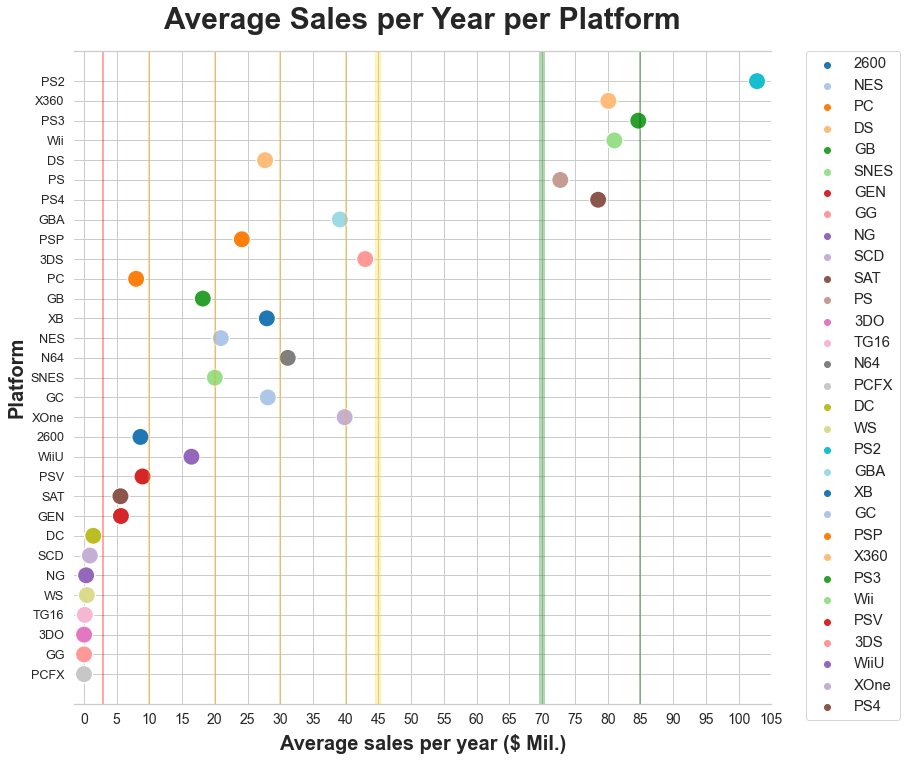

Platforms that are still used in 2016 statistics:

,platform,peak_year,min,max,lifespan,active_years,activity_ratio,total_sales,sales_per_year_lifespan,sales_per_active_year,100pct_active_sales_forecast,years_to_peak,years_to_dep
17,PS3,2011,2006,2016,11,11,1.000,931.34,84.667,84.667,931.34,6,5
26,Wii,2009,2006,2016,11,11,1.000,891.18,81.016,81.016,891.18,4,7
28,X360,2010,2005,2016,12,12,1.000,961.24,80.103,80.103,961.24,6,6
18,PS4,2015,2013,2016,4,4,1.000,314.14,78.535,78.535,314.14,3,1
2,3DS,2011,2011,2016,6,6,1.000,257.81,42.968,42.968,257.81,1,5
30,XOne,2015,2013,2016,4,4,1.000,159.32,39.830,39.830,159.32,3,1
27,WiiU,2014,2012,2016,5,5,1.000,82.19,16.438,16.438,82.19,3,2
13,PC,2011,1985,2016,32,26,0.812,255.76,7.992,9.837,314.78,27,5
20,PSV,2012,2011,2016,6,6,1.000,53.81,8.968,8.968,53.81,2,4


In [43]:
# Printing a plot description -
print('Plot of the average sales per year between various platforms:\n\
      \033[1m\x1b[4mNote\x1b[0m: Red line represents the $3M mark.')

# Adding lines showing separation between each decade -
plt.axvline(10, 0,1, c='orange', alpha=0.45), plt.axvline(30, 0,1, c='orange', alpha=0.45);
plt.axvline(40, 0,1, c='orange', alpha=0.45), plt.axvline(70, 0,1, c='green', alpha=0.3, linewidth=6);
plt.axvline(85, 0,1, c='darkgreen', alpha=0.45), plt.axvline(20, 0,1, c='orange', alpha=0.45);
plt.axvline(3, 0,1, c='red', alpha=0.45), plt.axvline(45, 0,1, c='gold', alpha=0.3, linewidth=6);

# Plotting a scatterplot for the average sales per year between various platforms -
sns.scatterplot(data=range_per_plat.sort_values('total_sales', ascending=False), x='sales_per_year_lifespan', y='platform', \
                hue='platform', s=300, palette='tab20', hue_order=order_to_plot)

# Setting customized modification parameters for plot:
plt.title('Average Sales per Year per Platform',\
          fontdict = {'fontsize':30, 'fontweight':'bold'}, y=1.025)
sns.set(font_scale=1.35, style='whitegrid', rc = {'figure.figsize':(15.5,10)})
sns.despine(left=True, top=False)
# Mods for ticks and labels -
plt.xlim(-1.5,105), plt.xticks(range(0,110,5), size=14);
plt.xlabel('Average sales per year ($ Mil.)', fontdict = {'fontsize':20, 'fontweight':'bold'}, labelpad=6.5);
plt.ylabel('Platform', fontdict = {'fontsize':20, 'fontweight':'bold'});
# Mods for legend
plt.legend(bbox_to_anchor=(1.05, 1.0), loc='upper left', borderaxespad=0)

# Show plot -
plt.show()

# Printing the newest platforms stats -
print('\033[1m\x1b[4mPlatforms that are still used in 2016 statistics\x1b[0m:',end='')
display(range_per_plat[range_per_plat['max']==2016].sort_values('sales_per_active_year', ascending=False))

Observing the plot above, we can see that indeed the most of the top-selling platforms exceeded the wide and green mark line which represents 70M dollars average yearly sales. The highest yearly-selling platform is again, the `'PS2'`, at about 102M dollars a year. The `'PS3'`, `'Wii'` and `'X360'` platforms, ***which are still in use in 2016***, are each selling ~84.7M dollars, ~81.01M dollars and 80.1M dollars per year, in order, but are soon to depreciate from the market, while the latter might depreciate completely after the last year.

In terms of looking at newer platforms who make high average yearly sales, the winner **by far** - and the next one in the 'sales per year' leaderboard - is the `'PS4'` platform, making 78.53M dollars in sales per year. Going on with new-era related platform, the ones following the PS4 are the `'3DS'` and `'XOne'` platforms, selling averagely ~43M dollars and ~40M dollars a year, accordingly. The `'WiiU'` platform, which is the third newest platform, has reached merely 16.43M dollars a year after it's 5 year span in the market.

#### ***Conclusion regarding the mean sales per year:***

With about 102M dollars a year, the `'PS2'` was the top seller again even year-to-year, but since it has depreciated in 2011 it is no longer important to us in that specific analysis section. 

Looking at the next platforms, which all still active in 2016, the leaders were, in order:
1. `'PS3'` - Selling averagely 84.7M dollars a year.
2. `'Wii'` - Selling averagely 81.01M dollars a year.
3. `'X360'` - Selling averagely 80.1M dollars a year.
4. `'PS4'` - Selling averagely 78.53M dollars a year.

The top 3 platforms above are expected to depreciate from the market in a year or two tops. Therefore, considering the best platform for future releases, the far superior leader in average yearly sales is the `'PS4'`, who passed the 70M dollars mark with just 4 years of activity. The next recommended new-era platforms following are, orderly, the `'XOne'` and `'3DS'`, As the `'3DS'` platform *does* pass the `'XOne'` platform by ~2.1M dollars, the `'XOne'` is at it's peak years and might still grow in numbers in the following 2-3 years, while the `'3DS'` platform is destined to drop from it's peak in a year tops, along with it's sales numbers.

## 5.3 Choosing a time period to work with

In this section I'll narrow the data so that we'll look only at data that is relevant to the analysis and our future projections.

We know from our prior analysis that the 80's released platforms were the best in terms of lifespan but didn't have a very high activity ratio, and since the 90's released platforms were dying in the same rate as entering the market, we can't look at the last milneia's period (1980-2000) let alone the 90's because the trend changed through time.

Nevertheless, we know platforms released in the last decade lived averagely 10.25 up to 12 years tops, so since we want to analyze data that is relevant to the next years and particularly 2017, we will take data from 2004 and forth, which is the expected average of 10 years of lifespan plus a safety distance of 2 years from the current year of the data which is 2016:

In [44]:
# Filtering the main DFs to include data only from after 2004:
print('\033[1m\x1b[4mNew DFs shares of the old data\x1b[0m:',
      end='\n\n')
# 1. Filter the base `games` DF to games made after 2004 -
new_era_games = games.query('year_of_release > 2004')
# Share of the original DF -
print(f'Share of `new_era_games` from the original `games` DF: \
{len(new_era_games) / len(games):.2%} rows of the original DF')

# 2. Filter the aggregated `unique_games` DF -
ne_uniq_games = unique_games.query('year_of_release > 2004')
# Share of the original DF -
print(f'Share of `ne_uniq_games` of the original `unique_games` DF: \
{len(ne_uniq_games) / len(unique_games):.2%} of the games')

# 3. Filter the aggregated `unique_plats` DF -
ne_uniq_plats = unique_plats.query('year_of_release > 2004')
# Share of the original DF -
print(f'Share of `ne_uniq_plats` of the original `unique_plats` DF: \
{len(ne_uniq_plats) / len(unique_plats):.2%} of the rows')

# 4. Filter the `ranges_per_plat` DF -
ne_ranges = range_per_plat[range_per_plat['max'] >= 2004]
# Share of the original DF -
print(f'Share of platforms that were in the market from 2004 and forth from the total amount: \
{len(ne_ranges) / len(range_per_plat):.2%} of the platforms')

New DFs shares of the old data:

Share of `new_era_games` from the original `games` DF: 68.55% rows of the original DF
Share of `ne_uniq_games` of the original `unique_games` DF: 63.90% of the games
Share of `ne_uniq_plats` of the original `unique_plats` DF: 46.22% of the rows
Share of platforms that were in the market from 2004 and forth from the total amount: 51.61% of the platforms


#### *Results:*

While filtering the data to the relevant period, we maintined to keep:
- 68.55% of the original DF rows.
- 63.9% of the games (7.4k games).
- 51.61% of the platforms (16 platforms).

## 5.4 Analyzing the PS4 platform specific data

In this section we'll analyze the Playstation 4 (i.e. `'PS4'`), one of the popular platform in the last years.

We'll take a look at how user and professional reviews affect sales After that we'll build a scatterplot and calculate the correlation between reviews and sales.

The reason for choosing the PS4 is that of all active platforms in the market on the year of 2016, in it's 4th year it still managed to become the 5nd best all time at average sales per year with 78.53M dollars, and that's pre-peak. As we've already concluded in the peak analysis section above, platforms reach their highest year between year 4 to 5 while platforms who lived for 4 years and reached it's peak or pre-peak take averagely 5 to 6 years to get to their peak year, so we can research it during peak and check what's making the platform rise so fast when it is still considered at peak years.

Let's create a DF for the platform's data:

In [45]:
# Presenting some stats about the PS4 platform itself -
print('\033[1m\x1b[4mStats on PS4 itself\x1b[0m:',end='')
display(ne_ranges[ne_ranges['platform']=='PS4']);

# Presenting some stats about the PS4 platform through years -
print('\n\033[1m\x1b[4mStats for PS4 through years\x1b[0m:',end='')
display(ne_uniq_plats[ne_uniq_plats['platform']=='PS4']);

Stats on PS4 itself:

,platform,peak_year,min,max,lifespan,active_years,activity_ratio,total_sales,sales_per_year_lifespan,sales_per_active_year,100pct_active_sales_forecast,years_to_peak,years_to_dep
18,PS4,2015,2013,2016,4,4,1.0,314.14,78.535,78.535,314.14,3,1



Stats for PS4 through years:

,platform,year_of_release,eu_sales,jp_sales,mean_yearly_sales,na_sales,other_sales,total_sales,peak_year
699,PS4,2013,11.05,0.94,0.406094,10.13,3.87,25.99,2015
700,PS4,2014,46.50,2.97,0.444444,34.75,15.78,100.00,2015
701,PS4,2015,51.76,6.31,0.433942,42.37,18.46,118.90,2015
702,PS4,2016,31.78,5.74,0.422256,21.49,10.24,69.25,2015


As you can see yourselves, the PS4 has been in the market for 4 years including the current year of 2016, it sold almost 26M dollars worth of sales in it's first year and jumped right into 100M dollar in sales at it's second year, and although sales in 2016 might seem lower than 2015, remember that we already know that "2016 data might be incomplete", so the number might be higher after the full year numbers arrives. Overall we can see it has a great potential and growth trend.

Now that we've got acquainted with the platform, let's create a filtered DF that contain only rows where the platform is `'PS4'`: 

In [46]:
# Filtering the `ne_games` data to include only rows where the 'PS4' is the platform -
ps4_data = new_era_games.query('platform == "PS4"')

# Printing some information on the new data -
print(f'\033[1m\x1b[1mShare of `ps4_data` rows from the original `new_era_games` DF:\x1b[0m \
{len(ps4_data) / len(new_era_games):.2%} rows of the DF\n\n\
\033[1m\x1b[4mPrinting the data\'s information\x1b[0m:\n')
ps4_data.info()

Share of `ps4_data` rows from the original `new_era_games` DF: 3.48% rows of the DF

Printing the data's information:

<class 'pandas.core.frame.DataFrame'>
Int64Index: 392 entries, 31 to 16585
Data columns (total 14 columns):
 #   Column               Non-Null Count  Dtype   
---  ------               --------------  -----   
 0   name                 392 non-null    object  
 1   platform             392 non-null    category
 2   year_of_release      392 non-null    int64   
 3   genre                392 non-null    category
 4   na_sales             392 non-null    float64 
 5   eu_sales             392 non-null    float64 
 6   jp_sales             392 non-null    float64 
 7   other_sales          392 non-null    float64 
 8   critic_score         252 non-null    float64 
 9   user_score           257 non-null    float64 
 10  rating               392 non-null    category
 11  total_sales          392 non-null    float64 
 12  years_since_release  392 non-null    int64   
 13  mea

Although we have a fairly small amount of 392 rows, be noted that the PS4 is one of the columns with the least missing values in the columns out of the other active platforms in 2016. as you can see in the missing values plot below:

In [47]:
#Creating a unique platforms list -
uniq_list = range_per_plat[range_per_plat['max']==2016].sort_values\
('sales_per_active_year', ascending=False)['platform'].unique()

# Creating DF where there's a values counts for rows `critic_score` is null -
critic_score = new_era_games[new_era_games['platform'].isin(uniq_list)]\
[(new_era_games['critic_score'].isna())]['platform'].value_counts() / new_era_games['platform'].value_counts()
critic_score = pd.DataFrame(critic_score, index=critic_score.index); # Turning to DF
critic_score.columns = ['score'] #Changing to a uniting column name
critic_score.index.names = ['platform'] # Re-calling index
critic_score['section'] = 'critic_score' # Creation uniting identifier

# Creating DF where there's a values counts for rows `user_score` is null -
user_score = new_era_games[new_era_games['platform'].isin(uniq_list)]\
[(new_era_games['user_score'].isna())]['platform'].value_counts() / new_era_games['platform'].value_counts()
user_score = pd.DataFrame(user_score, index=user_score.index); # Turning to DF
user_score.columns = ['score'] #Changing to a uniting column name
user_score.index.names = ['platform'] # Re-calling index
user_score['section'] = 'user_score' # Creation uniting identifier

# Appending DFs to each other - 
miss_scores = critic_score.append(user_score).dropna()

# Plotting shares of missing values from columns -
fig = px.bar(miss_scores, y='score', x=miss_scores.index, color='section', barmode='group', \
             title='Share of missing values of `user_score` and `critic_score` from all active platforms',\
             width=1000, height=475, color_discrete_sequence=["blue", "goldenrod"])
fig.update_xaxes(position=0.5)
fig.update_layout(legend_title_font_size=3)
fig.update_yaxes(range=[0,1])
fig.update_layout(yaxis_tickformat = '%')

# Show plot -
fig.show()

C:\Users\lior-\AppData\Local\Temp\ipykernel_14016\3681720819.py:6: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  critic_score = new_era_games[new_era_games['platform'].isin(uniq_list)]\
C:\Users\lior-\AppData\Local\Temp\ipykernel_14016\3681720819.py:14: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  user_score = new_era_games[new_era_games['platform'].isin(uniq_list)]\
C:\Users\lior-\AppData\Local\Temp\ipykernel_14016\3681720819.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  miss_scores = critic_score.append(user_score).dropna()


### 5.4.1 Analyzing the effect of user and professional reviews on sales for the PS3

We'll begin by checking the correlation of the `user_score` and `critic_score` over the `total_sales`:

In [48]:
# Printing a correlation matrix -
ps4_data.corr()

,year_of_release,na_sales,eu_sales,jp_sales,other_sales,critic_score,user_score,total_sales,years_since_release,mean_yearly_sales
year_of_release,1.000000,-0.248961,-0.208306,-0.060993,-0.234796,-0.021142,0.152447,-0.235032,-1.000000,-0.005272
na_sales,-0.248961,1.000000,0.785362,0.472981,0.944259,0.415008,-0.020933,0.928160,0.248961,0.797193
eu_sales,-0.208306,0.785362,1.000000,0.464563,0.944698,0.346720,-0.048925,0.958157,0.208306,0.878931
jp_sales,-0.060993,0.472981,0.464563,1.000000,0.496467,0.322358,0.171332,0.527129,0.060993,0.489071
other_sales,-0.234796,0.944259,0.944698,0.496467,1.000000,0.409191,-0.035639,0.998051,0.234796,0.889793
critic_score,-0.021142,0.415008,0.346720,0.322358,0.409191,1.000000,0.557654,0.406568,0.021142,0.388011
user_score,0.152447,-0.020933,-0.048925,0.171332,-0.035639,0.557654,1.000000,-0.031957,-0.152447,-0.039082
total_sales,-0.235032,0.928160,0.958157,0.527129,0.998051,0.406568,-0.031957,1.000000,0.235032,0.893812
years_since_release,-1.000000,0.248961,0.208306,0.060993,0.234796,0.021142,-0.152447,0.235032,1.000000,0.005272
mean_yearly_sales,-0.005272,0.797193,0.878931,0.489071,0.889793,0.388011,-0.039082,0.893812,0.005272,1.000000


The `critic_score` has a positive correlation of 0.406 over the total sales, meaning that the critics score has some positive effect on total sales.

Meanwhile the `user_score` seems to have a negative correlation of roughly -0.032 over the total sales, which is a pretty insignificant effect. Nevertheless, we need to remember that this is only a raw statistic, and we need to dive deeper into the data to fully understand if the parameter has a connection to total sales.

In order to plot the PS4 total sales against it's users and critics score, we will drop the missing values from the DF and then test the effects of `user_score` and `critic_score` over the `total_sales` in a separate graph for each parameter:

In [49]:
# Dropping the missing values -
filt_ps4 = ps4_data.dropna()

# Printing the amount of rows left -
print(f'the `filt_ps4` DF has taken {len(filt_ps4)} rows out of the original DF\'s {len(ps4_data)}.\n\n\
\033[1m\x1b[4mPlease note that the plots below are interactive\x1b[0m.')

# Plotting the relation between the critic score to total sales -
fig = px.scatter(filt_ps4, y='total_sales', x='critic_score', color='genre', opacity=0.7, \
                 range_x=[15,100] , range_y=[-0.25,6], trendline='lowess', \
                title='Relation between the critic score and total sales')

# Plot modification:
fig.update_xaxes(position=0.5)
fig.update_layout(title_font_size=22, legend_title_font_size=16, xaxis_title="Critic Score", yaxis_title="Total Sales")
fig.update_layout(legend_title='Genre')

# Show plot -
fig.show()

# Plotting the relation between the user score to total sales -
fig = px.scatter(filt_ps4, y='total_sales', x='user_score', color='genre', opacity=0.7, \
                 range_x=[1,10] , range_y=[-0.25,5], trendline='lowess', \
                title='Relation between the user score and total sales')

# Plot modification:
fig.update_xaxes(position=0.5)
fig.update_layout(title_font_size=22, legend_title_font_size=16, xaxis_title="User Score", yaxis_title="Total Sales")
fig.update_layout(legend_title='Genre')

# Show plot -
fig.show()

the `filt_ps4` DF has taken 249 rows out of the original DF's 392.

Please note that the plots below are interactive.


The analysis will be splitted below to separate paragraphs for each plot:

###### ***The effect of the critic score over the total sales***

As you can pretty clearly see, even with all the lines hiding each other, there's a bullish trend on total sales that looks almost like a perfect rising parabola, as until the ~65 score the total sales stay pretty much the same, but after the critic score rise above ~65 it starts to rise rapidly in sales. A game in the PS4 that gets to a score of averagely ~75 reaches is able to reach one million dollar in sales, while a game with a score of ~85 is able to reach averagely 2 million dollars.


###### ***The effect of the user score over the total sales***

On the other hand, the `user_score` plot looks a little messier. Although there is a general rise in sales as user score for the game rise, when genre is specifically `'racing'` it seems that sales are falling pretty heavily when user score rise. Also, some genres have no effect at all. 
Nevertheless, games that pass a score ~7 averagely reach close to 1 million in sales, and games that reached 2 million in sales average a score of about 7.8.

#### ***Conclusions regarding the effect of user and professional reviews on sales for the PS3****

The `critic_score` has a pretty positive effect over the `total_sales` numbers after the score pass the 65 to 70 mark.
The `user_score` on the contrary, generally has a correlating effect over the `total_sales`, although it is a relatively weak one and has some dependency on the game's genre at times.


### 5.4.2 Comparing sales of the PS4 to other platforms

In that section, we'll compare the sales of the specific games sold on the PS4 platform to sales of these exact games in all other platforms selling them: 

In [50]:
# Making a list of all unique games sold on the PS4 -
uniq_games_ps4 = ps4_data['name'].unique().tolist();

# Make a filtered DF of the same games from all other platforms -
other_data = new_era_games.query('platform != "PS4"');
other_data = other_data[other_data['name'].isin(uniq_games_ps4)];

# Create an identifier column -
other_data['section'] = 'others'
ps4_data['section'] = 'PS4'

# Appending the DFs to each other -
total_filt = ps4_data.append(other_data);

C:\Users\lior-\AppData\Local\Temp\ipykernel_14016\3612411844.py:10: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\lior-\AppData\Local\Temp\ipykernel_14016\3612411844.py:13: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.



Now that we have our combined DF, let's check the difference on sales between the PS4 to other platforms

In [51]:
# Plotting the sales of the PS4 unique games compared to the same games on other platforms -
fig = px.scatter(total_filt, y='total_sales', x='platform', color='section', opacity=0.7, \
                 range_y=[-0.25,22], width=950, height=650, \
                 title='Unique PS4 games sales vs. other platforms sales, per same games')

# Plot modification:
fig.update_xaxes(position=0.5)
fig.update_layout(title_font_size=22, legend_title_font_size=16, legend_title='', \
                  xaxis_title="Platform", yaxis_title="Total Sales", uniformtext_mode='hide')
fig.update_traces(marker=dict(size=12),
                  selector=dict(mode='markers'))
# Show plot -
fig.show()

# Plotting the total sales of the PS4 vs. others of the PS4's unique games -
fig = px.bar(total_filt, y='total_sales', x='platform', color='section', opacity=0.7, \
                  width=950, height=650, text='name', \
                 title='Sales of the PS4 games, PS4 vs. other platforms')

# Plot modification:
fig.update_xaxes(position=0.5)
fig.update_layout(title_font_size=22, legend_title_font_size=16, legend_title='', \
                  xaxis_title="Platform", yaxis_title="Total Sales", \
                  uniformtext_mode='hide')
fig.update_traces(marker=dict(size=12), selector=dict(mode='markers'),
                  textposition='inside')
# Show plot -
fig.show()

#### ***Conclusion regarding sales of the PS4 games in comparison to other platforms****

As we can see from the plots above, although sales over the specific GTA V game are far higher in the `PS3` and `X360` platform than the `PS4` platform, **the PS4 rakes much more sales overall than all other platforms selling it's unique offered games to the public audience**. The PS4 sells slightly over 315M dollars, which is a little over 2 times than it's predecessor, the PS3, which is also the 2nd best selling platform in the above comparison, selling roughly 151.1M dollars worth of sales. The best selling games for the PS4 were the COD: Black Ops 3 with 14.63M dollars and the GTA V with 12.62M dollars, which were also top sellers in most of the other platforms.

## 5.5 How does genre affects sales?

Let's take a look at the general distribution of games by genre and check what can we say about the most profitable genre andif we can generalize about genres with high and low sales.

To check this subject clearly, we'll do the following both to the games of our already analyzed `PS4` platform to check it in the micro-level, and to all the platforms in order to see the macro level as well.

### **The `genre` effect over `total_sales` in PS4**

Let's check the total sales from each genre in the `PS4` platform:

In [52]:
# Plotting the total sales per genre, divided in each genre by sales of unique games, in a barplot -
fig = px.bar(ps4_data, x='total_sales', y='genre', color='genre', text='name', opacity=0.7, \
                  width=1000, height=700, range_x=[0,100], \
                 title='Genre effect over total sales PS4 games')

# Plot modification:
fig.update_xaxes(position=0.5)
fig.update_layout(title_font_size=22, legend_title_font_size=16, legend_title='Genre', \
                  xaxis_title="Total Sales", yaxis_title="Genre", \
                  uniformtext_mode='hide')
# Show plot -
fig.show()

# Plotting the total sales per genre, divided in each genre by specific games sales, in a scatterplot -
fig = px.scatter(ps4_data, y='total_sales', x='genre', color='genre', opacity=0.65, \
                  width=1000, height=700, range_y=[0,15], \
                 title='Genre effect over total PS4 sales in specific games')

# Plot modification:
fig.update_xaxes(position=0.5)
fig.update_layout(title_font_size=22, legend_title_font_size=16, legend_title='Genre', \
                  xaxis_title="Genre", yaxis_title="Total Sales", \
                  uniformtext_mode='hide')
fig.update_traces(marker=dict(size=12), selector=dict(mode='markers'))
# Show plot -
fig.show()

As clearly seen, the top selling genre in the `PS4` platform is `Action` games with slighly over 96M dollars, followed by the `Shooter` genre which sold a games worth of 88.5M dollars. Looking at the scatterplot below you can see that the main reason the `Action` genre is leading sales over the `Shooter` genre is that it makes more averagely-high selling games than the latter, as the `Shooter` genre's reason of selling so much is because it got some individual games selling higher than all the rest, while the majority sell a pretty average amount each.

The `Action` genre also almost double the `Sports` genre, which is in the 3rd place in the sales leaderboard and had 55.6M dollars worth of sales. The interesting thing about `Sports` genre games is that they sell pretty steady numbers, as you can see in the scatterplot they fade smoothly until about the ~2.4M dollar mark. It's worth to add that the 4th selling `Role-Playing` genre might sold a relatively low 29M dollars worth of sales, but the genre is pretty steady at bringing top-selling games at around 2M dollars each, and is one on the only 4 genres that were listed in that paragraph that has passed the 12.15M dollars glass ceiling.

The least selling genre was the `Strategy` genre selling 0.62M dollars worth of sales, although the `Puzzle` genre is right below it with *only one game* selling 0.2M dollars (which cannot be considered comparable due to it's lack of comparable items). The 2nd worse sales genre is the `Simulation` genre that sold 1.23M dollars, and followed by it came the `Adventure` genre which jumped in sales to 6.34M dollars sales in the 3rd place.

#### ***To sum it up:***
- **The PS4's best-selling genres were:**
    1. `Action` - 96.1M dollars.
    2. `Shooter` - 88.5M dollars.
    3. `Sports` - 55.6M dollars
    4. Worth to mention: `Role-Playing` - 29M dollars.
    
    
- **The PS4's worst selling genre were:**
    1. `Strategy` - 0.62M dollars.
    2. `Simulation` - 1.23M dollars.
    3. `Adventue` - 6.34M dollars.
    4. `Platform` - 7.69M dollars.

### **The `genre` effect over `total_sales` in all platforms**

Let's check the total sales from each genre in all of the platform and see if things are the same between platforms:

In [53]:
# A) Print the total sales number for each genre:
uniq_genres = new_era_games['genre'].unique().tolist() # Storing data in variable
print('\033[1m\x1b[4mTotal sales of each genre\x1b[0m:') # Printing data
for g in uniq_genres:
    print(f"{g} - {new_era_games[new_era_games['genre']==g]['total_sales'].sum():.5}")

# ------------------------------------------------------------------------------------------------------------------------  
# B) First plot
# Plotting the total sales per genre, divided in each genre by unique games -
fig = px.bar(new_era_games, x='total_sales', y='genre', color='genre', opacity=0.99, \
                  width=750, height=700, range_x=[0,1290],\
                 title='Genre effect over total sales in all platforms')

# Plot modification:
fig.update_xaxes(position=0.5);
fig.update_layout(title_font_size=26, legend_title_font_size=16, legend_title='Genre', \
                  xaxis_title="Total Sales", yaxis_title="Genre", \
                  uniformtext_mode='hide');
# Show plot -
fig.show()

# ------------------------------------------------------------------------------------------------------------------------
# C) Second plot
# Printing a note - 
print('\033[1m\x1b[32mPlease note\x1b[0m: \
The second plot (below) contains an outlier for the `Sports` genre worth 82.54M dollars.', end='')
# Plotting the total sales per genre, divided in each genre by specific games sales, in a scatterplot -
fig = px.scatter(new_era_games, y='total_sales', x='genre', color='genre', opacity=0.35, \
                  width=1050, height=700, range_y=[-0.5,36.5], \
                 title='Genre effect over total sales within all platforms in specific games sales')

# Plot modification:
fig.update_xaxes(position=0.5)
fig.update_layout(title_font_size=18, legend_title_font_size=16, legend_title='Genre', \
                  xaxis_title="Genre", yaxis_title="Total Sales", \
                  uniformtext_mode='hide')
fig.update_traces(marker=dict(size=12), selector=dict(mode='markers'))
# Show plot -
fig.show()

# ------------------------------------------------------------------------------------------------------------------------
# D) Printing the average sales per genre's game stat, that shows each genre's 
# total sales divided by it's amount of games, presenting a mean game total sales:
print('\033[1m\x1b[4mAverage sales per game of each genre\x1b[0m:') # Printing data
for g in uniq_genres:
    print(f"{g} - {new_era_games[new_era_games['genre']==g]['total_sales'].mean():.5}")

Total sales of each genre:
Sports - 853.34
Racing - 355.03
Platform - 303.06
Misc - 615.83
Simulation - 269.62
Action - 1202.0
Role-Playing - 550.78
Puzzle - 110.28
Shooter - 758.56
Fighting - 208.07
Adventure - 149.81
Strategy - 78.42


Please note: The second plot (below) contains an outlier for the `Sports` genre worth 82.54M dollars.

Average sales per game of each genre:
Sports - 0.61747
Racing - 0.55647
Platform - 0.71645
Misc - 0.45017
Simulation - 0.41866
Action - 0.46699
Role-Playing - 0.51619
Puzzle - 0.27639
Shooter - 0.91064
Fighting - 0.45629
Adventure - 0.14067
Strategy - 0.18583


***Through the plots***

First again, The `Action` genre is leading with a raking 1.202B (1202M) dollars worth of sales, leading by a distance. After that came the `Sports` and the `Shooter` genres with 853.34M dollars and 758.56M dollars, accordingly. The `Role-Playing` genre came 4th again with 550.78M dollars worth of sales, while `Misc` (i.e. Miscellaneous) is not a real genre, and more of a name for ungenred games, but it is still worth mentioning that the ungenred genre capped 615.83M dollars from sales.

Speaking of density, the top-selling `Action` genre didn't made it's fortune by making really high selling games exactly, but instead the genre made a lot of multi-millions games of more than 5M dollars and that's why ***the `Action` genre won hard on numbers only.*** The `Sports` genre did exactly the same as the `Action` genre, making even more medium selling games, but just didn't sell as much and didn't had the same demand as the latter, luckily for the genre, it had a few really high outliers selling more than most of the genres that raised it's total sales numbers. The `Shooter` genre worked more on making high-selling games at 5 to 7M dollars or more and also relied on demand for the genre, but just lacked the depth the others above it had.

The least selling genre was `Strategy` with 78.42M dollars, followed by `Puzzle` and `Adventure` with 110.28M dollars and 149.81M dollars, in order. The `Simulation` genre that was 2nd-worst for the PS4, actually ended as 5th worse overall with 269.62M dollars, above the `Fighting` genre who sold 208.07M dollars.

***Looking at the average game sales per genre***

Since some genres sold more purely because of game-making depth or specific outlier top-shelf-selling games, I've calculated the mean per genre statistics to help us see exactly what an average game would sell. The best- selling genre was no other than the `Shooter` genre with 0.91M per average game, after it came the surprising `Platform` genre, which might have only 303.06M in sales overall but sells 0.716M per genre game, and then the `Sports` genre with 0.617M per genre game.

The worst genre per game was the `Adventure` with 0.14M per game, then the `Strategy` genre with 0.185M per game at the 2nd place, then followed the `Puzzle` genre (0.276M per genre game) and the `Simulation` genre (0.418M per genre game). ***The `Action` genre was the 6th worst, from both sides***, with 0.467M dollars per an average genre game, proving that the genre is selling so much only because of demand, major depth of games, and a few key outlier top-sellers.

### ***Conclusion regarding how genre affects sales****

After conducting my research on genres, I've concluded that:
- The best-selling genre is:
    1. `Shooter`
    2. `Sports`
    3. Tied between:
        - `Action`
        - `Platform`
        
    The first two are top 3 sellers all time, while the `Shooter` genre will sell averagely more than all other games and is a sure top seller. The `Platform` genre is an underated genre because of it's total sales, but an average game sells more than other genres' games. The `Action` genre might be an optical illusion, but it will still sell if you're planning on numbers.


- The worst_selling genre is:
    1. `Strategy`
    2. Tied between:
        - `Adventure`
        - `Puzzle`
    3. `Fighting`
    
    All genres in clauses 1 and 2 are just bad options- they had almost no sells throughout the past, which in addition to their average sales per genre game statistics shows they're seriously lacking demand from users. The `Fighting` genre on the other hand, just doesn't sell enough, having 3 to 4 games that crossed the 4.5M dollars mark all time.

---------------
---------------

# 6. Create a user profile for each region

In the following section, we will create a user profile for users fron North America (i.e. NA), Europe (i.e. EU), and Japan (i.e. JP). The user profile will determine, for each region:
- The region's top five platforms.
- The region's top five genres. 
- If ESRB ratings is affecting sales in the individual region.


To make things simpler, we will automate the user profile creation. I'll begin by adding the regions' sales columns to the `ne_ranges` DF, which we created before, so that it will possess all data regarding unique platforms' all time behavior:

In [54]:
# A) Creating a filtered DF for `platform` - 
filt_range_reg = new_era_games[['platform', 'na_sales', 'eu_sales', 'jp_sales']]
filt_range_reg = filt_range_reg.pivot_table(values=['na_sales', 'eu_sales', 'jp_sales'],\
                          index='platform', aggfunc='sum')
# Merging sales data for all regions into the `ne_ranges` DF -
ne_ranges = ne_ranges.merge(filt_range_reg,on='platform', how='left') # This DF will be used for `platform` data

# ------------------------------------------------------------------------------------------------------------------------
# B) Creating a filtered DF for `genre` - 
genre_per_region = new_era_games[['genre', 'na_sales', 'eu_sales', 'jp_sales']]
genre_per_region = genre_per_region.pivot_table(values=['na_sales', 'eu_sales', 'jp_sales'],\
                          index='genre', aggfunc='sum') # This DF will be used for `genre` data
# Flattening `genre_per_region` index:
idx = [x for x in genre_per_region.index] # Salvaging the index column values
genre_per_region['genre'] = idx        # re-Creating the originally-index column as a normal column
genre_per_region.reset_index(drop=True,inplace=True) # Resetting index
cols = genre_per_region.columns           # Making a variable storing all the DF columns' names
cols = cols.insert(0,'genre')       # Inserting the index as new column

# Re-indexing the DF, dropping the original index salvaged column -
genre_per_region = genre_per_region.reindex(columns=cols).iloc[:,:-1]

# ------------------------------------------------------------------------------------------------------------------------
# C) Create a filtered DF to compare the ESRB `rating` to sales of each region -
esrb_region = new_era_games[['rating','na_sales', 'eu_sales', 'jp_sales']]

Now I will create 2 different functions below that will help us later:
- the `region_review()` function - That will automate plot and data stats creation for us.
- The `top_n()` function - That creates leaderboards filters for us.


				Initialting user profile automation process...

Printing plots for region: 'na_sales'-
    Note: Remember data for 2016 may be incomplete.


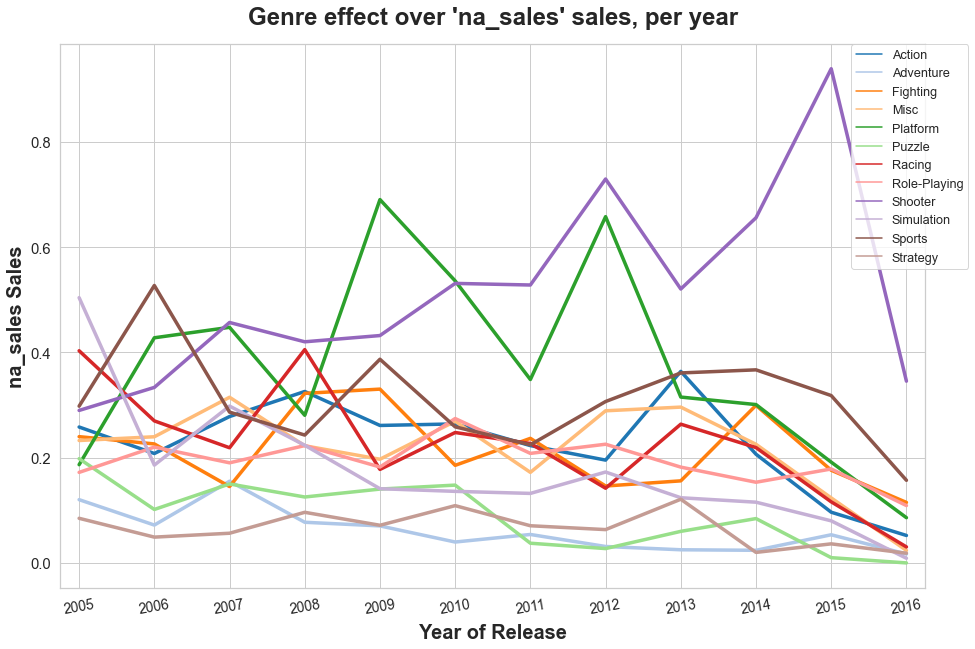

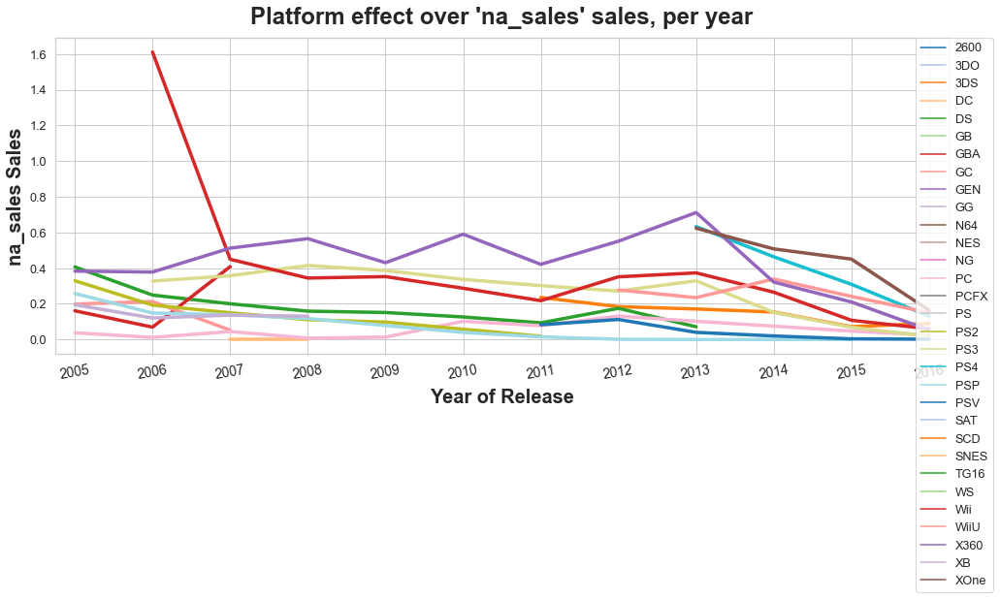

Printing the "na_sales" region top five genres:


,genre,na_sales
0,Action,580.04
1,Sports,432.70
2,Shooter,400.96
3,Misc,311.82
4,Role-Playing,211.85



Printing the "na_sales" region top five platforms


,platform,na_sales
0,X360,595.74
1,Wii,486.87
2,PS3,390.13
3,DS,371.98
4,PS2,200.49




------------------------------------------------------------------------------------------------------------------------

				User profile automation process complete

Printing plots for region: 'eu_sales'-
    Note: Remember data for 2016 may be incomplete.


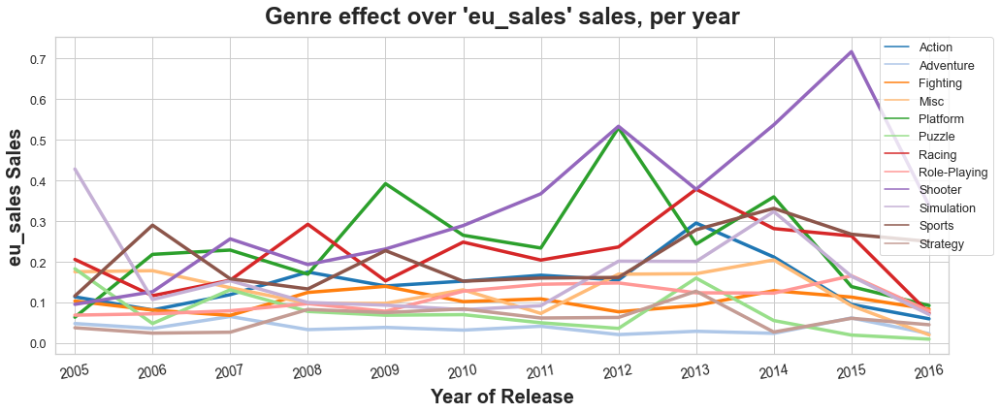

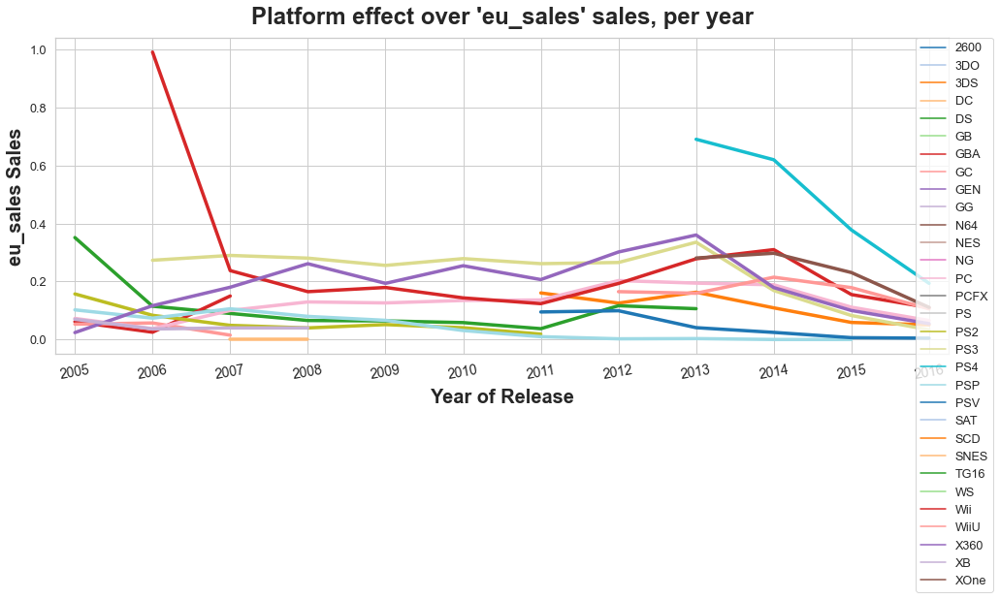

Printing the "eu_sales" region top five genres:


,genre,eu_sales
0,Action,372.58
1,Sports,265.61
2,Shooter,248.07
3,Misc,167.09
4,Racing,129.05



Printing the "eu_sales" region top five platforms


,platform,eu_sales
0,PS3,327.21
1,X360,268.32
2,Wii,258.32
3,DS,184.48
4,PS4,141.09




------------------------------------------------------------------------------------------------------------------------

				User profile automation process complete

Printing plots for region: 'jp_sales'-
    Note: Remember data for 2016 may be incomplete.


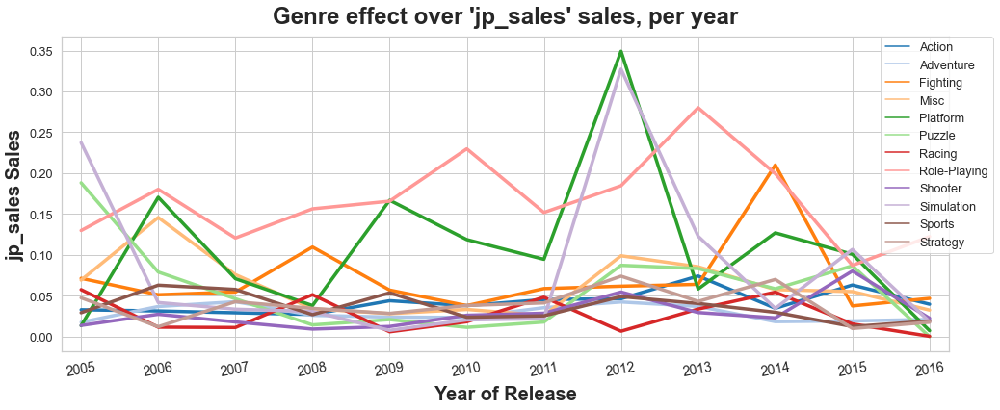

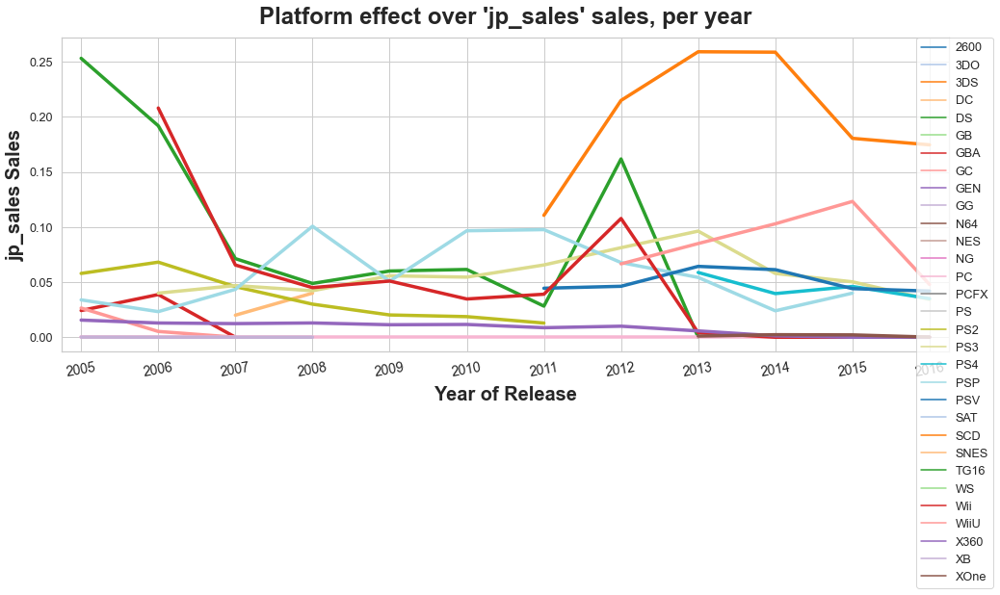

Printing the "jp_sales" region top five genres:


,genre,jp_sales
0,Role-Playing,179.60
1,Action,108.39
2,Misc,72.49
3,Sports,52.51
4,Platform,36.32



Printing the "jp_sales" region top five platforms


,platform,jp_sales
0,DS,171.35
1,3DS,100.62
2,PS3,79.41
3,PSP,73.85
4,Wii,68.28




------------------------------------------------------------------------------------------------------------------------

				User profile automation process complete



In [55]:
# A) Creating a dictionary of the regions to explore -
reg_list = ['na_sales', 'eu_sales', 'jp_sales']

# ------------------------------------------------------------------------------------------------------------------------
# B) Defining the region_review() function 
# that shows effect of genre and platform over region from the dictionary above -
def region_review(df, sales_reg):
    group_list = ['genre', 'platform'] # Storing groupby values
    reg_name = sales_reg # Storing area name
    
    for g in group_list:
        # Plotting the plot -
        sns.lineplot(data=df, x='year_of_release', y=sales_reg, hue=g, ci=None, \
                 palette='tab20', sizes=g, markers=True, linewidth = 3.5)
        
        # Setting custumized modification parameters for subplots:
        gen = g.capitalize() # Setting interim variable
        plt.title(f"{gen} effect over '{reg_name}' sales, per year",\
                  fontdict = {'fontsize':24, 'fontweight':'bold'}, y=1.025)
        sns.set(font_scale=1.15, style='whitegrid', rc = {'figure.figsize':(16.5,6)})
        # Mods for ticks and labels -
        plt.xlim(2004.75,2016.25), plt.xticks(range(2005,2017,1), rotation=10, size=14);
        plt.xlabel('Year of Release', fontdict = {'fontsize':20, 'fontweight':'bold'}, labelpad=6.5);
        plt.ylabel(f"{reg_name} Sales", fontdict = {'fontsize':20, 'fontweight':'bold'});
        # Mods for legend
        plt.legend(bbox_to_anchor=(1.05, 1.0), loc='upper right', borderaxespad=0)
        plt.show()

        
# ------------------------------------------------------------------------------------------------------------------------
# C) Defining the top_n() function -
def top_n(df, lboard_col, top5_parameter, top=5, ascend=False, xtra_lb_col=True):
    '''
    The top_n() function takes a DataFrame\'s column (i.e. leaderboard column), sort it,
    and return the top n rows after it is sorted.
    
    Parameters:
    df: DataFrame.
    lboard_col: The column to sort the DataFrame by; The "leaderboard" column.
    top5_parameter: The values in the top-n that's returned.
    top: Amount of leaderboard rows. Based at 5.
    ascend: Set to False by default to return a descending leaderboard. Check True to return a rising leaderboard.
    xtra_lb_col: Return both given columns (lboard_col and top5_parameter).
    '''
    n=top
    if xtra_lb_col== True:
        return df.sort_values(lboard_col, ascending = ascend)\
    .reset_index(drop=True).loc[:,[top5_parameter, lboard_col]][:n]
        
    else:
        return df.sort_values(lboard_col, ascending = ascend).reset_index(drop=True)[top5_parameter][:n]

# ------------------------------------------------------------------------------------------------------------------------
# Making an automated plotting for loop that creates user profile per region:
print('\t\t\t\t\033[1m\x1b[31mInitialting user profile automation process...\x1b[0m\n')
for r in reg_list:
    print(f'\033[1m\x1b[31mPrinting plots for region:\x1b[0m \033[1m\x1b[4m\'{r}\'\x1b[0m-\n\
    Note: Remember data for 2016 may be incomplete.')
    region_review(new_era_games, r)
    print(f'Printing the "{r}" region top five genres:')
    display(top_n(genre_per_region, r, 'genre'))
    print(f'\nPrinting the "{r}" region top five platforms')
    display(top_n(ne_ranges,r,'platform'))
    # Plotting relation between ESRB rating to sales -
    fig = px.bar(esrb_region, y='rating', x=r, \
                 text='rating', title='Effect of ESRB rating over on sales on the region')
    # Plot modification:
    fig.update_xaxes(position=0.5)
    fig.update_layout(title_font_size=18, legend_title_font_size=16, legend_title='Genre', \
                      xaxis_title="Total Sales", yaxis_title="ESRB Rating", \
                      uniformtext_mode='hide')
    # Show plot -
    fig.show()
    print('\n\n------------------------------------------------------------------------------------------------------------------------\n')
    print('\t\t\t\t\033[1m\x1b[32mUser profile automation process complete\x1b[0m\n')



### ***Analysis Conclusions regarding each region's user profile***

***North America user profile***

Looking at genre, it seems like the best selling genres for the NA was the `Action` genre selling 580.04M dollars, it seems like it keep a pretty value over the year with small faltering movements, but overall the total sales doesn't change from it. After that came the `Sports`  and `Shooter` genres with 432.7M and 400.96M in order, while the `Sports` genre is pretty close to the `Action` genre in behaviour, **the `Shooter` genre seems to correlate nicely overall**, rising up with total sales. The 4th and 5th genres were `Misc` (311.82M) and `Role-Playing` (211.85M) with still near zero correlation.

Speaking of platforms, the favorite one in america was the `X360` with 595.74M worth of sales, and has fallen of it's trend last year (2015), and as we know from prior analysis, it's most probably the platform's last year. The rest of the top 5 had the same steadily-falling trend, and were, the `Wii` (486.87M), `PS3` (390.13M), `DS` (371.98M) and `PS2` (200.49M) platforms.

***Europe user profile***

The leading genres top 4 out of 5 were still in the same order, with slightly lower sales numbers, while the 5th-best selling `Racing` genre sold 129.05M dollars. The `Shooter` genre has the highest rise in correlation to sales in the past years to date, and the `Racing` genre is following right after it. The `Sports` and `Action` genres had a slight rise in 2014, but the `Action` had genre fiddled again in the following years, keeping it's "no correlation" policy.

The most likeable platform in Europe was the `PS3` with 327.21M dollars sales, which started to fade in correlation since 2013, followed by it came the `X360` (268.32M), `Wii` (258.32M) and `DS` (184.48M), all with similar fading or dying trend. The last was the `PS4` that sold 141.09M and had a fall in correlation this current year.

***Japan user profile***

Japan's leading genre was the `Role-Playing` genre which sold 179.6M, and it seems like it was pretty nicely correlated averaging near the 0.2 correlation for past years. Nevertheless, correlation from it fell in 2015 and started rising back up in 2016, so I can surely say it's more correlated than what we've seen from the other 2 regions. Next ones were `Action` (108.39M), `Misc` (72.49M), and `Sports` (52.51M), all without any special correlation. The last of all `Platform` genre was the only incomprehensible variable in terms of correlation - it had the exact same trend type in all regions, moving up and down every few years, and while it could be interpreted as a real correlation in some way, it is all probably circustantial, since we can clearly see the correlation changes in all regions and not only in Japan.

The best-selling platform was the `DS` with 171.35M which had a slight correlation to sales in 2012 and then died. Following came the `3DS` who has a sure correlation of about 0.2+ to the total sales in the region, and sold 100.62M. The rest were the `PS3` (m) and `PSP` (73.85M)who had each a correlation of up to 0.1 until 2012-2013, and the `Wii` which had no correlation and had 68.28M dollars worth of sales in the region.

### ***ESRB rating effect on sales in different areas***

**In the NA and EU regions:**

After checking the ESRB rating connection to sales, we've seen that the NA and EU act and sell pretty much the same numbers.
ESRB had the following effects over the regionS:
- For games that had an 'E' rating, sales climbed up to about 1B dollars (~1000M).
- For games with an 'M' rating, sales reached 638M.
- For games with a 'T' rating, sales reached 622M.
- Worth to mention: The E10+ reached 343~M.

**In the JP region:**

In Japan on the contrary, ESRB had the following effects over the regionS:
- The 'T' rating is leading sales with 268M.
- The 'E' rating is selling almost ~259M.
- The 'M' reating is selling 49.5
- The E10+ sold a bit over 39M.

#### *Conclusion regarding the ESRB rating**

'E' and 'T' rated games sell more than the rest. 'M' rated games are a good third option.

-----------------------
-----------------------

# 7. Testing hypotheses

After we've finally finished our analysis, we will use our complete data to test the next statistical hypotheses.

## 7.1 Hypothsis #1 -
### Average user ratings of the Xbox One and PC platforms are the same:

*The null hypothsis* will be that the average user ratings are not equal, and *the alternative hypothesis* will be that they are. We will use a two sided t-test with two independent samples and will use an alpha of 3% to determine the result:

In [56]:
# Setting the arrays for testing -
sample_1 = games[games['platform']=='XOne']['user_score']
sample_2 = games[games['platform']=='PC']['user_score']

# Setting the alpha -
alpha = 0.03

# Performing the T-test -
results = st.ttest_ind(sample_1, sample_2,nan_policy='omit')

# Printing the results of the test -
print(f"\033[1m\x1b[1mp-value:\x1b[0m {results.pvalue}")

if results.pvalue < alpha:
    print('The null hypothesis is \033[1m\x1b[31mrejected\x1b[0m')
else:
    print('The null hypothesis \033[1m\x1b[32mcannot be rejected\x1b[0m')

p-value: 1.3037979620152955e-05
The null hypothesis is rejected


#### *Conclusion:*

The null hypothesis was rejected, meaning the average user ratings for **the Xbox One and the PC are same**.

## 7.2 Hypothsis #2 -
### Average user ratings for the Action and Sports genres are different:

*The null hypothsis* will be that the average user ratings are the same, and *the alternative hypothesis* will be that they aren't. We will use a two sided t-test with two independent samples and will use an alpha of 3% to determine the result:

In [57]:
# Setting the arrays for testing -
sample_1 = games[games['genre']=='Action']['user_score']
sample_2 = games[games['genre']=='Sports']['user_score']

# Setting the alpha -
alpha = 0.03

# Performing the T-test -
results = st.ttest_ind(sample_1, sample_2,nan_policy='omit')

# Printing the results of the test -
print(f"\033[1m\x1b[1mp-value:\x1b[0m {results.pvalue}")

if results.pvalue < alpha:
    print('The null hypothesis is \033[1m\x1b[31mrejected\x1b[0m')
else:
    print('The null hypothesis \033[1m\x1b[32mcannot be rejected\x1b[0m')

p-value: 0.0683368650387165
The null hypothesis cannot be rejected


#### *Conclusion:*

The null hypothesis was *not* rejected, meaning **we can't know whether the samples averages differ**.

# 8. General Conclusion

At a first glance at the data we saw a few problems, while the biggest of them were:
- Missing values in the `'Name'`, `'Year_of_Release'`, `'Genre'`, `'Critic_Score'`, `'User_Score'` and `'Rating'` columns. There are around 40.4 to 51.3 percents of the games with a missing value in all rating and scores columns including the ESRB `Rating`.
- The first 25 percentiles of the data has games ranged from the start of the eighties to the start of the new milenia (1980 to 2003), presenting a much wider qurtile range than the other quartiles, meaning there are much fewer games from the period before 2003, and there might be less games to explore from these years.

## 1. Preprocessing the Data

I've dealt with the missing values accordingly:
- Dropped the 2 rows containing missing values in the `'name'` and `'genre'` columns from the DF.
- Dropped the 269 rows which contained missing values in the `'year_of_release'` column, which stands for 1.6% of the whole data.
- Used the created mode rating per genre dictionary (i.e. `genre_mode_rating`) and the defined `mode_rating()` function to fill the 6676 missing values in the data's ESRB `rating` column using the mode per genre.
- ***Regarding to the 40.4 and 51.3 missing values percentages in `user_score` and `critic_score`, we've decided to leave them as they are, with the exception of converting the `user_score` TBD values to NaNs.***


After dealing with the initial problems from the raw data, I enriched the DataFrame with some useful metrics for a deeper later analysis.

## 2. The Analysis

After studying various subjects we arrived to the following findings:

- While studying the years distribution of the data, we've found that the data is pretty uneven between time periods, as rows from the pre-00's (1980-2000) is just a bit under 11.7% of the total data, underepresenting the "last milenia" period. The years from 2010 forward are representing a little over a quarter of the data, while the 00's decade has the largest representation.
- While studying the most profitable platforms Ice games were sold at in all time, I've found that the most profitable platform all-time for Ice games, by a big distance, was the PS2, followed by the Xbox 360 (i.e. 'X360') and the PS3. There are just 6 platforms that passed the 315M dollar all-time mark. Adding all that together shows that although variances are really close and sales have spreaded all along the ladder - the 'PS2' had more high-selling years than the 'Wii', although the latter has reached the 'PS2' numbers in some occasions.
- We compared the top 4 most profitable platforms sales over their lifespan and came to a conclusion there's a common behaviour that all the 4-top selling platforms, which happened to be all from the new milenia, share, in terms of reaching the peak years. ***It takes a solid platform 3 to 4 years to get to it's peak years, and a max of 5 to 6 years to reach the peak-sales year, meaning the peak years last for about 1 to 3 years. After dropping from the peak-sales the platform leaves the "peak years" and starts to fall in sales numbers, it takes a platform about 5 to 7 years to stop making sales and depreciating from the market, or to be precise - 10 to 11 years since it's release.***
- My conclusions regarding lifespan and activity lifetime were:
    - A normal platform released in the 80's has about 10 to 12 active years tops before depreciation.
    - Average lifetime for platforms released in the 00's decade is 10.25 years with a 100% activity ratio, giving a hopefull forecast that the trend continues.
    - Activity ratio per lifespan in higher in the new milenia.
- My conclusion regarding best platforms for the future was that ***I strongly recommend choosing the `'PS4'` as the main platform*** to release games to in order to increase profitability in the fastest time period.

- In order to reach further understanding of the purpose an ideal platform should serve, or to say precisely, the purposed time it should serve, I've decided to explore peak years for the platforms. These are the conclusions I arrived to:
    - **The 80's platforms take the longest to reach their peak value** and they have a below-average sales growth rate, but **might still be profitable over the *really* long term**.
    - **The 00's solid platforms seems to averagely have the best pre-post peak dispersion**:
- Looking at the next platforms, which all still active in 2016, the leaders were, in order:
1. `'PS3'` - Selling averagely 84.7M dollars a year.
2. `'Wii'` - Selling averagely 81.01M dollars a year.
3. `'X360'` - Selling averagely 80.1M dollars a year.
4. `'PS4'` - Selling averagely 78.53M dollars a year.

- The top 3 platforms above are expected to depreciate from the market in a year or two tops. Therefore, considering the best platform for future releases, the far superior leader in average yearly sales is the `'PS4'`, who passed the 70M dollars mark with just 4 years of activity. The next recommended new-era platforms following are, orderly, the `'XOne'` and `'3DS'`, As the `'3DS'` platform *does* pass the `'XOne'` platform by ~2.1M dollars, the `'XOne'` is at it's peak years and might still grow in numbers in the following 2-3 years, while the `'3DS'` platform is destined to drop from it's peak in a year tops, along with it's sales numbers.

**After this section we filtered our data to work only with platforms that their last year was on 2004 or later, so we could have a better image of the current situation of the market.**

At that point we started analyzing the Playstation 4 platform. 
- My conclusions regarding the effect of user and professional reviews on sales for the PS3 were that The `critic_score` has a pretty positive effect over the `total_sales` numbers after the score pass the 65 to 70 mark. The `user_score` on the contrary, generally has a correlating effect over the `total_sales`, although it is a relatively weak one and has some dependency on the game's genre at times.
- Regarding sales of the PS4 games in comparison to other platforms, **the PS4 rakes much more sales overall than all other platforms selling it's unique offered games to the public audience**. The PS4 sells slightly over 315M dollars, which is a little over 2 times than it's predecessor, the PS3, which is also the 2nd best selling platform in the above comparison, selling roughly 151.1M dollars worth of sales. The best selling games for the PS4 were the COD: Black Ops 3 with 14.63M dollars and the GTA V with 12.62M dollars, which were also top sellers in most of the other platforms.
- **The PS4's best-selling genres were:**
    1. `Action` - 96.1M dollars.
    2. `Shooter` - 88.5M dollars.
    3. `Sports` - 55.6M dollars
    4. Worth to mention: `Role-Playing` - 29M dollars.
- **The PS4's worst selling genre were:**
    1. `Strategy` - 0.62M dollars.
    2. `Simulation` - 1.23M dollars.
    3. `Adventue` - 6.34M dollars.
    4. `Platform` - 7.69M dollars.

While researching genre's effect of the PS4 sales, I've also did the same check against all platforms and found that:
- The best-selling genre is:
    1. `Shooter`
    2. `Sports`
    3. Tied between:
        - `Action`
        - `Platform`
        
    The first two are top 3 sellers all time, while the `Shooter` genre will sell averagely more than all other games and is a sure top seller. The `Platform` genre is an underated genre because of it's total sales, but an average game sells more than other genres' games. The `Action` genre might be an optical illusion, but it will still sell if you're planning on numbers.


- The worst_selling genre is:
    1. `Strategy`
    2. Tied between:
        - `Adventure`
        - `Puzzle`
    3. `Fighting`
    
    All genres in clauses 1 and 2 are just bad options- they had almost no sells throughout the past, which in addition to their average sales per genre game statistics shows they're seriously lacking demand from users. The `Fighting` genre on the other hand, just doesn't sell enough, having 3 to 4 games that crossed the 4.5M dollars mark all time.

## 3. Profiling users in each region

To profile each user quicker and better, I've used the region_review() and top_n() functions I've created to create an analysis loop, where in each iteration the loop functions analyze the data for us, with some brief explanations, after going through my functions findings and conducting my own as well, I have created these user profiles for each region.

### ***North America user profile***

Top 5 genres are:
1. `Action` - 580.04M
2. `Sports` - 432.7M
3. `Shooter` - 400.96M
4. `Misc` - 311.82M
5. `Role-Playing` - 211.85M
    
Top 5 platforms are:
1. `X360` - 595.74M
2. `Wii` - 486.87M
3. `PS3` - 390.13M
4. `DS` - 371.98M
5. `PS2` - 200.49M

### ***Europe user profile***

Top 5 genres are:
1. `Action` - 372.58M
2. `Sports` - 265.61M
3. `Shooter` - 248.07M
4. `Misc` - 167.09M
5. `Racing` - 129.05M
    
Top 5 platforms are:
1. `PS3` - 327.21M
2. `X360` - 268.32M
3. `Wii` - 258.32M
4. `DS` - 184.48M
5. `PS4` - 141.09M

### ***Japan user profile***

Top 5 genres are:
1. `Role-Playing` - 179.6M
2. `Action` - 108.39M
3. `Misc` - 72.49M
4. `Sports` - 52.51M
5. `Platform` - 36.32M
    
Top 5 platforms are:
1. `DS` - 171.35M
2. `3DS` - 100.62M
3. `PS3` - 79.41M
4. `PSP` - 73.85M
5. `Wii` - 68.28M

### ***ESRB rating effect on sales***

In the NA and EU region:
- For games that had an 'E' rating, sales climbed up to about 1B dollars (~1000M).
- For games with an 'M' rating, sales reached 638M.
- For games with a 'T' rating, sales reached 622M.
- Worth to mention: The E10+ reached 343~M.

In Japan:
- The 'T' rating is leading sales with 268M.
- The 'E' rating is selling almost ~259M.
- The 'M' reating is selling 49.5
- The E10+ sold a bit over 39M.

#### Conclusion regarding the ESRB rating

'E' and 'T' rated games sell more than the rest. 'M' rated games are a good third option.

## 4. Hypotheses testing

In that section, we used our complete data to test the following statistical hypotheses:

**Hypothesis $#1$ - Average user ratings of the Xbox One and PC platforms are the same**

To affirm that hypothesis, we determined *The null hypothsis* will be that the average user ratings are not equal, and *the alternative hypothesis* will be that they are. We will use a two sided t-test with two independent samples and will use an alpha of 3% to determine the result.

> The results of the T-test testified the null hypothesis was rejected, meaning the average user ratings for **the Xbox One and the PC are same**.

**Hypothesis $#2$ - Average user ratings for the Action and Sports genres are different**

To affirm that hypothesis, we determined *The null hypothsis* will be that the average user ratings are the same, and *the alternative hypothesis* will be that they aren't. We will use a two sided t-test with two independent samples and will use an alpha of 3% to determine the result.

> The results of the T-test indicated that he null hypothesis was *not* rejected, meaning **we can't know whether the samples averages differ**.

## 5. Final Conclusion

Following this report, that was conducted in order to identify patterns that determine whether a game will succeed or not and will allow me to spot potential big winners and plan advertising campaigns ahead to 2017, I've reached a few sugestions.

Since each platform that reached it's peak fell rapidly after, we need to choose a solid platform that will reach it's peak years pretty soon but won't reach it's peak year right away, and choose it the year, or year before it enters the "peak years" stage, because that way the company could rake a rising year to year profit from a game for 2 to 3 years at least before the game sales will fall with the platform.

***Therefore, the best option right now to pick is the Playstation 4 platform***, which may be at the first peak year, but it's already top-5 all-time sales numbers speak for themselves, and it sure got a few more years to fulfill it's mssive growth rate. Next best will be the Xbox One for the same reasons.

Regarding to new game genres, ***the best, safest, and smartest pick of all will be the `Shooter` genre***, which is making the most per an average game, meaning it has the best chance to succeed. Another good option will be to release games of the `Sports` genre, which is the 2nd most recommended option. In case you'll choose the PS4 eventually, it's also worth looking into `Role-Playing` games, which has a nice potential in that platform and has a really big market in Japan, and that's in case the company prefers to expand it's income from the region as well.

No matter the region released to, **I'd really recommend to release games rated 'E' first** because they take far more money of the users' pockets, Next one is 'T'.

***For all I recommended above:***

I'd recommend to advertise  PS4 games on these genres to the NA and JP regions mainly, as that will ensure maximum profitability for the next sales years to come.